In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
import sklearn as sk
import seaborn as sns

In [2]:
df = pd.read_csv('AmesHousing.csv',  sep='\t')
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [4]:
df.describe()

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2930.00000,2.930000e+03,2930.000000,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2907.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,1465.50000,7.144645e+08,57.387372,69.224590,10147.921843,6.094881,5.563140,1971.356314,1984.266553,101.896801,...,93.751877,47.533447,23.011604,2.592491,16.002048,2.243345,50.635154,6.216041,2007.790444,180796.060068
std,845.96247,1.887308e+08,42.638025,23.365335,7880.017759,1.411026,1.111537,30.245361,20.860286,179.112611,...,126.361562,67.483400,64.139059,25.141331,56.087370,35.597181,566.344288,2.714492,1.316613,79886.692357
min,1.00000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,733.25000,5.284770e+08,20.000000,58.000000,7440.250000,5.000000,5.000000,1954.000000,1965.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129500.000000
50%,1465.50000,5.354536e+08,50.000000,68.000000,9436.500000,6.000000,5.000000,1973.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,2197.75000,9.071811e+08,70.000000,80.000000,11555.250000,7.000000,6.000000,2001.000000,2004.000000,164.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213500.000000
max,2930.00000,1.007100e+09,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


In [5]:
df.isnull()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,False,False,False,False,False,False,False,True,False,False,...,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,False,True,False,False,...,False,True,False,True,False,False,False,False,False,False
2,False,False,False,False,False,False,False,True,False,False,...,False,True,True,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,True,False,False,...,False,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,False,True,False,False,...,False,True,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,False,False,False,False,False,False,False,True,False,False,...,False,True,False,True,False,False,False,False,False,False
2926,False,False,False,False,True,False,False,True,False,False,...,False,True,False,True,False,False,False,False,False,False
2927,False,False,False,False,False,False,False,True,False,False,...,False,True,False,False,False,False,False,False,False,False
2928,False,False,False,False,False,False,False,True,False,False,...,False,True,True,True,False,False,False,False,False,False


In [6]:
df.isnull().sum()

Order               0
PID                 0
MS SubClass         0
MS Zoning           0
Lot Frontage      490
                 ... 
Mo Sold             0
Yr Sold             0
Sale Type           0
Sale Condition      0
SalePrice           0
Length: 82, dtype: int64

In [7]:
missing = df.isnull().sum()[df.isnull().sum() > 0]
missing.sort_values(ascending=False)

Pool QC           2917
Misc Feature      2824
Alley             2732
Fence             2358
Mas Vnr Type      1775
Fireplace Qu      1422
Lot Frontage       490
Garage Qual        159
Garage Cond        159
Garage Yr Blt      159
Garage Finish      159
Garage Type        157
Bsmt Exposure       83
BsmtFin Type 2      81
Bsmt Cond           80
Bsmt Qual           80
BsmtFin Type 1      80
Mas Vnr Area        23
Bsmt Full Bath       2
Bsmt Half Bath       2
BsmtFin SF 1         1
BsmtFin SF 2         1
Electrical           1
Total Bsmt SF        1
Bsmt Unf SF          1
Garage Area          1
Garage Cars          1
dtype: int64

<Axes: >

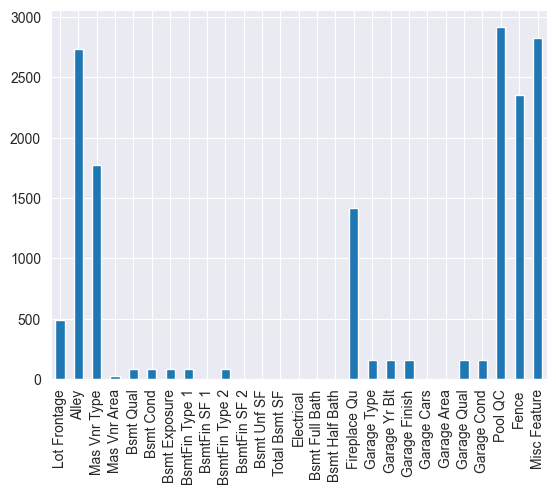

In [8]:
missing.plot(kind='bar')

Alley, PoolQC, Fence, MiscFeature have a lot of missing values. We will drop these columns.

In [9]:
df = df.drop(columns=['Alley', 'Pool QC', 'Fence', 'Misc Feature'])

In [10]:
df.info

<bound method DataFrame.info of       Order        PID  MS SubClass MS Zoning  Lot Frontage  Lot Area Street  \
0         1  526301100           20        RL         141.0     31770   Pave   
1         2  526350040           20        RH          80.0     11622   Pave   
2         3  526351010           20        RL          81.0     14267   Pave   
3         4  526353030           20        RL          93.0     11160   Pave   
4         5  527105010           60        RL          74.0     13830   Pave   
...     ...        ...          ...       ...           ...       ...    ...   
2925   2926  923275080           80        RL          37.0      7937   Pave   
2926   2927  923276100           20        RL           NaN      8885   Pave   
2927   2928  923400125           85        RL          62.0     10441   Pave   
2928   2929  924100070           20        RL          77.0     10010   Pave   
2929   2930  924151050           60        RL          74.0      9627   Pave   

     Lo

We noticed we could combine Fireplace and FireplaceQu into a single column, a boolean column indicating whether a house has a fireplace or not.

In [11]:
df['Has Fireplace'] = df['Fireplaces'] > 0

In [12]:
df[['Has Fireplace','Fireplaces']].head(20)

,Has Fireplace,Fireplaces
0,True,2
1,False,0
2,False,0
3,True,2
4,True,1
5,True,1
6,False,0
7,False,0
8,True,1
9,True,1


In [13]:
df = df.drop(columns=['Fireplaces', 'Fireplace Qu'])

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 77 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Lot Shape        2930 non-null   object 
 8   Land Contour     2930 non-null   object 
 9   Utilities        2930 non-null   object 
 10  Lot Config       2930 non-null   object 
 11  Land Slope       2930 non-null   object 
 12  Neighborhood     2930 non-null   object 
 13  Condition 1      2930 non-null   object 
 14  Condition 2      2930 non-null   object 
 15  Bldg Type        2930 non-null   object 
 16  House Style      2930 non-null   object 
 17  Overall Qual  

Checking the correlation of Land Slope and Land Contour with SalePrice.

In [15]:
df[['Land Slope', 'Land Contour', 'SalePrice']].head()

,Land Slope,Land Contour,SalePrice
0,Gtl,Lvl,215000
1,Gtl,Lvl,105000
2,Gtl,Lvl,172000
3,Gtl,Lvl,244000
4,Gtl,Lvl,189900


Checking how many entries of the pair Land Slope = Gtl and Land Contour = HLS.

In [16]:
df[(df['Land Slope'] == 'Gtl') & (df['Land Contour'] == 'HLS')]

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,...,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice,Has Fireplace
7,8,527145080,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,...,0,144,0,0,1,2010,WD,Normal,191500,False
280,281,908203100,20,RL,64.0,6410,Pave,Reg,HLS,AllPub,...,0,0,0,0,5,2010,WD,Normal,90000,False
303,304,910205120,50,RM,50.0,9140,Pave,Reg,HLS,AllPub,...,0,200,0,0,4,2010,COD,Normal,110000,False
321,322,921128020,20,RL,89.0,13214,Pave,IR1,HLS,AllPub,...,0,0,0,0,5,2010,WD,Normal,378500,True
347,348,527108070,20,RL,42.0,14892,Pave,IR1,HLS,AllPub,...,0,0,0,0,10,2009,WD,Normal,377500,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2617,2618,535425080,60,RL,NaN,18275,Pave,IR1,HLS,AllPub,...,0,0,0,0,9,2006,WD,Normal,277500,True
2730,2731,905351045,150,RL,NaN,1700,Pave,Reg,HLS,AllPub,...,0,200,0,0,4,2006,WD,Normal,148400,False
2821,2822,908127050,20,RL,73.0,16133,Pave,Reg,HLS,AllPub,...,0,112,0,0,12,2006,WD,Abnorml,119900,False
2851,2852,909250200,70,RL,69.0,4899,Pave,Reg,HLS,AllPub,...,0,0,0,0,6,2006,WD,Normal,149000,False


We will eliminate the entries with Land Slope = Gtl and Land Contour = HLS because they are obviously errors.

In [17]:
df = df[~((df['Land Slope'] == 'Gtl') & (df['Land Contour'] == 'HLS'))]

Feature Engineering: Adding total square footage of house and price per square foot as useful columns.

In [18]:
df['Total SF'] = df['Total Bsmt SF'] + df['1st Flr SF'] + df['2nd Flr SF']
df['Price per SF'] = df['SalePrice'] / df['Total SF']

Checking the correlation of the new columns with SalePrice.

In [19]:
df[['Total SF', 'Price per SF', 'SalePrice']].corr()

,Total SF,Price per SF,SalePrice
Total SF,1.000000,0.108053,0.789982
Price per SF,0.108053,1.000000,0.634888
SalePrice,0.789982,0.634888,1.000000


<Axes: >

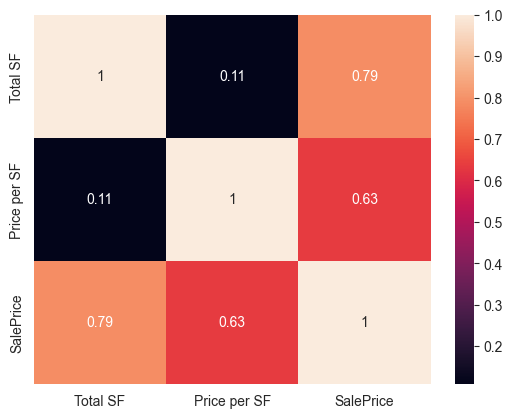

In [20]:
import seaborn as sns
sns.heatmap(df[['Total SF', 'Price per SF', 'SalePrice']].corr(), annot=True)

The strongest correlation is between Total SF and SalePrice. It is valuable for prediction.

Checking for other useless features.

In [21]:
missing_threshold = len(df) * 0.5
high_missing = df.isnull().sum()[df.isnull().sum() > missing_threshold]
high_missing

Mas Vnr Type    1731
dtype: int64

We will drop these columns with more than 50% missing values.

In [22]:
df = df.drop(columns=high_missing.index)

Checking if column was actually dropped.

In [23]:
'Mas Vnr Type' in df.columns

False

Checking distribution of SalePrice.

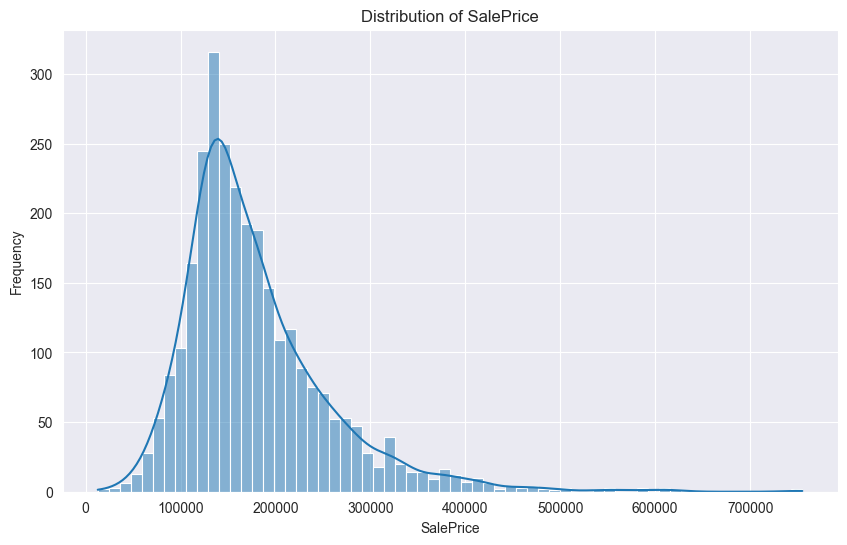

In [24]:
plt.figure(figsize=(10,6))
sns.histplot(df['SalePrice'], kde=True)
plt.title('Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.show()

In [25]:
df['SalePrice'].skew()

np.float64(1.7936903287672765)

In [26]:
df['SalePrice'].describe()

count      2851.000000
mean     178854.026307
std       77969.464595
min       12789.000000
25%      129000.000000
50%      160000.000000
75%      211750.000000
max      755000.000000
Name: SalePrice, dtype: float64

SalePrice is right-skewed. We will apply a log transformation to normalize it.

In [27]:
import numpy as np
df['Log SalePrice'] = np.log(df['SalePrice'])

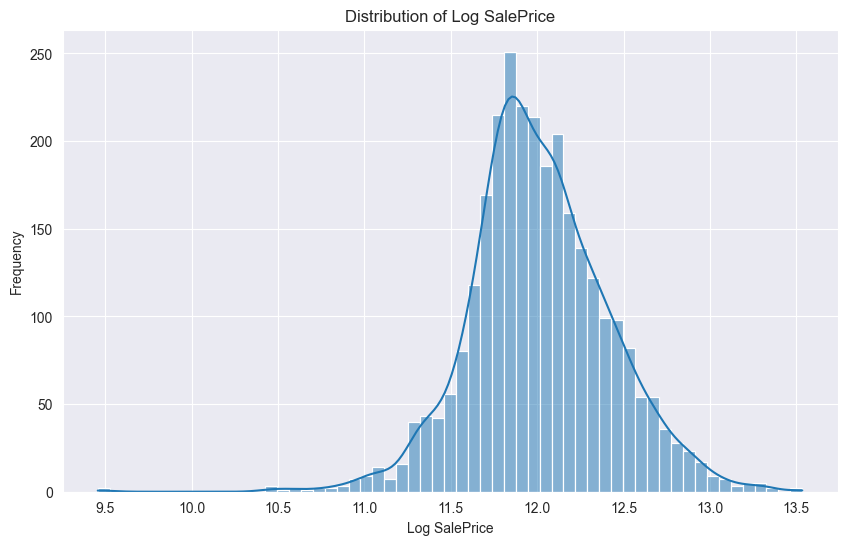

In [28]:
plt.figure(figsize=(10,6))
sns.histplot(df['Log SalePrice'], kde=True)
plt.title('Distribution of Log SalePrice')
plt.xlabel('Log SalePrice')
plt.ylabel('Frequency')
plt.show()

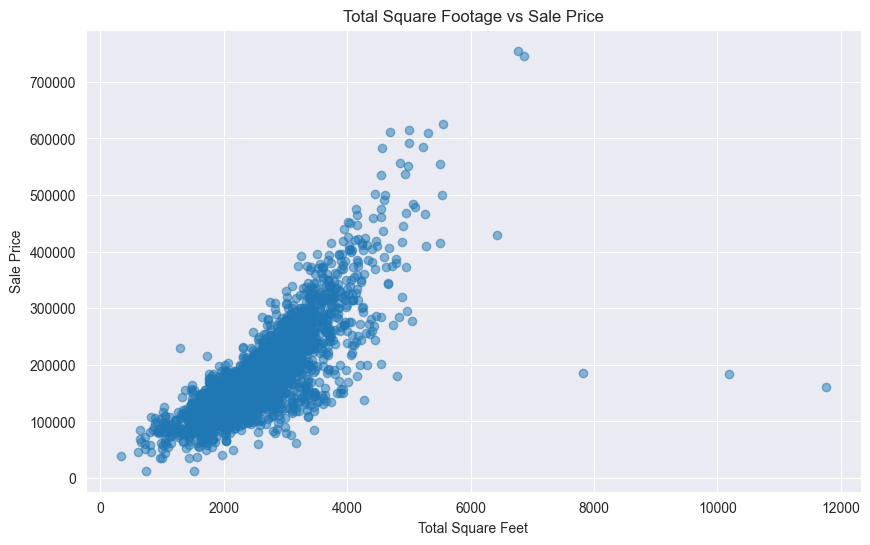

In [29]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Total SF'], df['SalePrice'], alpha=0.5)
plt.xlabel('Total Square Feet')
plt.ylabel('Sale Price')
plt.title('Total Square Footage vs Sale Price')
plt.show()

There is a positive correlation between Total SF and SalePrice. We checked using a scatter plot.

<Figure size 1200x600 with 0 Axes>

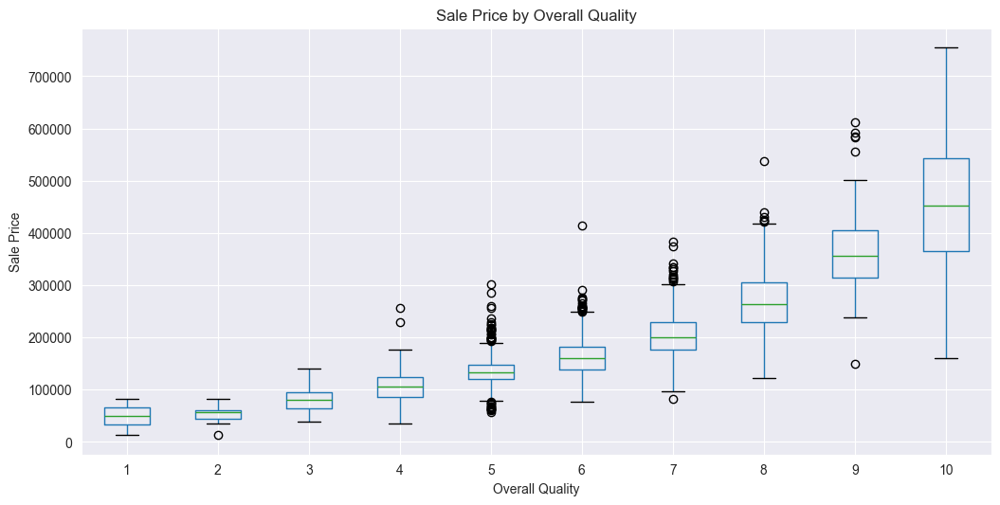

In [30]:
plt.figure(figsize=(12, 6))
df.boxplot(column='SalePrice', by='Overall Qual', figsize=(12, 6))
plt.suptitle('')
plt.xlabel('Overall Quality')
plt.ylabel('Sale Price')
plt.title('Sale Price by Overall Quality')
plt.show()

There is a strong positive correlation between Overall Quality and SalePrice. We checked using a box plot.

Lets check for outliers in SalesPrice.

In [31]:
Q1 = df['SalePrice'].quantile(0.25)
Q3 = df['SalePrice'].quantile(0.75)
IQR = Q3 - Q1

outliers = df[(df['SalePrice'] < Q1 - 1.5 * IQR) | (df['SalePrice'] > Q3 + 1.5 * IQR)]
print(f"Number of price outliers: {len(outliers)}")
outliers[['SalePrice', 'Total SF', 'Overall Qual']].head()

Number of price outliers: 126


,SalePrice,Total SF,Overall Qual
15,538000,4929.0,8
17,394432,3712.0,9
36,376162,3924.0,9
38,395192,3870.0,9
44,611657,4694.0,9


Lets add a linear regression line to the scatter plot of Total SF vs SalePrice.

In [32]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [33]:
X = df[['Total SF']].dropna()
y = df.loc[X.index, 'SalePrice']

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [35]:
model = LinearRegression()
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


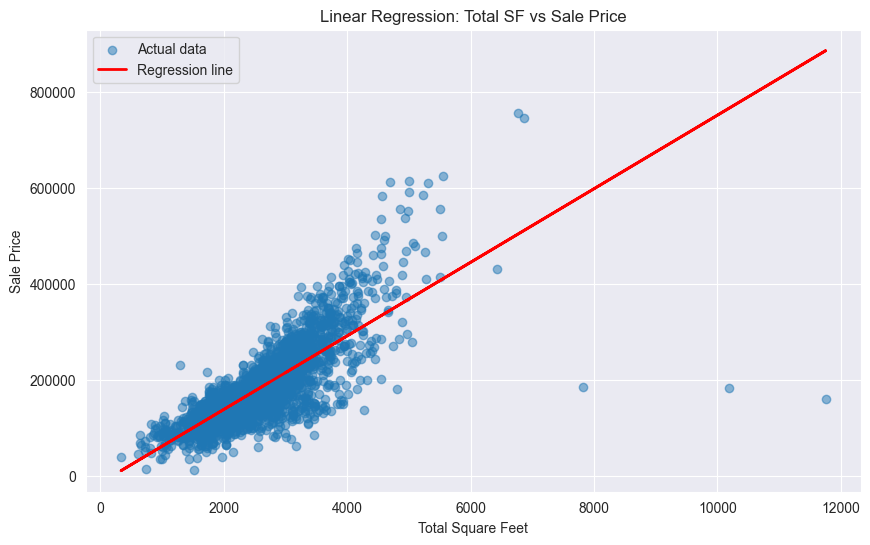

In [36]:
plt.figure(figsize=(10, 6))
plt.scatter(X, y, alpha=0.5, label='Actual data')
plt.plot(X, model.predict(X), color='red', linewidth=2, label='Regression line')
plt.xlabel('Total Square Feet')
plt.ylabel('Sale Price')
plt.title('Linear Regression: Total SF vs Sale Price')
plt.legend()
plt.show()

In [37]:
test_index = X_test.index[0]
test_value = X_test.iloc[0, 0]

actual = y_test.iloc[0]
predicted = model.predict([[test_value]])[0]

print(f"Actual price: ${actual:,.0f}")
print(f"Predicted price: ${predicted:,.0f}")
print(f"Difference: ${abs(actual - predicted):,.0f}")
print(f"Accuracy: {(1 - abs(actual - predicted)/actual) * 100:.1f}%")

Actual price: $167,000
Predicted price: $180,651
Difference: $13,651
Accuracy: 91.8%


C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


The prediction is reasonably accurate for a simple linear regression model.

In [38]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print(f"Mean Absolute Error: ${mae:,.2f}")
print(f"Mean Squared Error: ${mse:,.2f}")
print(f"Root Mean Squared Error: ${rmse:,.2f}")
print(f"R-squared: {r2:.4f}")

Mean Absolute Error: $31,431.66
Mean Squared Error: $1,995,726,499.84
Root Mean Squared Error: $44,673.55
R-squared: 0.6443


The evaluation metrics indicate that the model has some predictive power, but there is room for improvement.

Checking for linearly correlated features to remove multicollinearity.

In [39]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
correlations = df[numerical_cols].corr()['SalePrice'].sort_values(ascending=False)
print(correlations.head(15))

SalePrice         1.000000
Log SalePrice     0.945063
Overall Qual      0.792827
Total SF          0.789982
Gr Liv Area       0.706001
Garage Cars       0.643695
Garage Area       0.640139
Price per SF      0.634888
Total Bsmt SF     0.627823
1st Flr SF        0.614982
Year Built        0.551657
Full Bath         0.539046
Year Remod/Add    0.526485
Garage Yr Blt     0.525053
Mas Vnr Area      0.500835
Name: SalePrice, dtype: float64


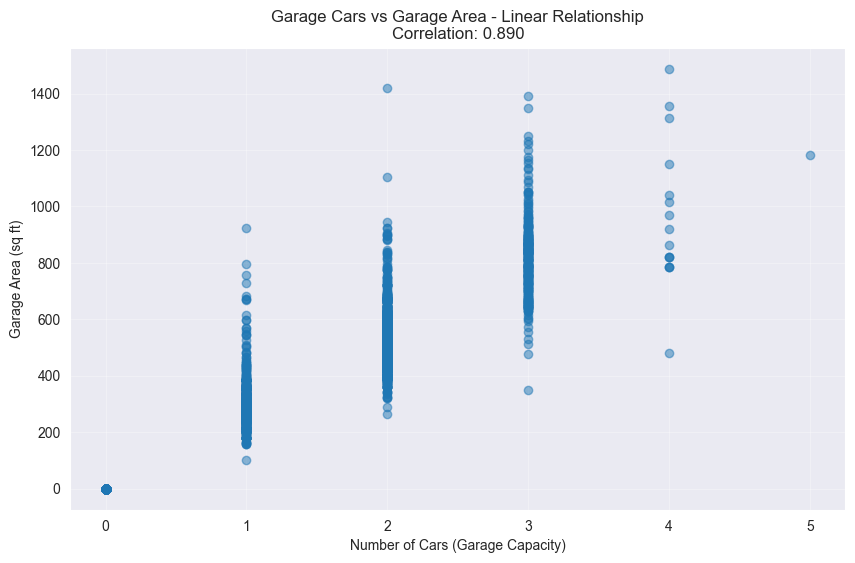

In [40]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Garage Cars'], df['Garage Area'], alpha=0.5)
plt.xlabel('Number of Cars (Garage Capacity)')
plt.ylabel('Garage Area (sq ft)')
plt.title(f'Garage Cars vs Garage Area - Linear Relationship\nCorrelation: {df["Garage Cars"].corr(df["Garage Area"]):.3f}')
plt.grid(True, alpha=0.3)
plt.show()

Garage Cars and Garage Area are highly correlated. This proves linearity

# LAB 2

In [41]:
import xgboost as xgb
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    make_scorer
)
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold, cross_val_score

Creating price categories on quantiles (3 classes for better balance)

In [42]:
df['PriceCategory'] = pd.qcut(df['SalePrice'], 
                                q=3, 
                                labels=['Low', 'Medium', 'High'])

print("Category counts:")
print(df['PriceCategory'].value_counts().sort_index())

Category counts:
PriceCategory
Low       950
Medium    950
High      951
Name: count, dtype: int64


Visualizing price categories

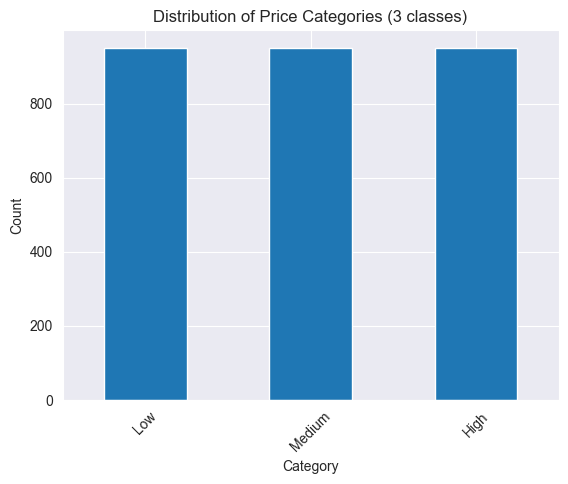

In [43]:
df['PriceCategory'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Price Categories (3 classes)')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

Data is evenly distributed among the 3 categories.

Preparing features for modeling

In [44]:
categorical_features = df.select_dtypes(include=["object", "category"]).columns
numerical_features = df.select_dtypes(include=["int64", "float64"]).columns

Remove target and leak columns

In [45]:
leak_cols = ['SalePrice', 'Log SalePrice', 'Price per SF', 'Order', 'PID', 'PriceCategory']
X = df[numerical_features.tolist() + categorical_features.tolist()].copy()
X = X.drop([col for col in leak_cols if col in X.columns], axis=1, errors='ignore')
X = X.dropna()

Get target for valid indices

In [46]:
y_cont = df.loc[X.index, 'SalePrice']
y_cat = pd.qcut(y_cont, q=3, labels=['Low', 'Medium', 'High'])

Encode categorical features using one-hot encoding

In [47]:
# Only keep categorical features that are still in X after dropping leak columns
categorical_features_in_X = [col for col in categorical_features if col in X.columns]
X = pd.get_dummies(X, columns=categorical_features_in_X, drop_first=True)

Encode target

In [48]:
le = LabelEncoder()
y = le.fit_transform(y_cat)

print(f"\nFeature matrix shape: {X.shape}")
print(f"Target classes: {le.classes_}")


Feature matrix shape: (2149, 226)
Target classes: ['High' 'Low' 'Medium']


## Preparing Train-Test Splits

10% test split with stratification

In [49]:
X_train_10, X_test_10, y_train_10, y_test_10 = train_test_split(
    X, y, test_size=0.10, random_state=42, stratify=y
)

20% test split with stratification

In [50]:
X_train_20, X_test_20, y_train_20, y_test_20 = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

In [51]:
print("\n10% Split:")
print(f"  Train: {X_train_10.shape}, Test: {X_test_10.shape}")
print(f"  Train classes: {pd.Series(y_train_10).value_counts().sort_index().to_dict()}")
print(f"  Test classes: {pd.Series(y_test_10).value_counts().sort_index().to_dict()}")

print("\n20% Split:")
print(f"  Train: {X_train_20.shape}, Test: {X_test_20.shape}")
print(f"  Train classes: {pd.Series(y_train_20).value_counts().sort_index().to_dict()}")
print(f"  Test classes: {pd.Series(y_test_20).value_counts().sort_index().to_dict()}")


10% Split:
  Train: (1934, 226), Test: (215, 226)
  Train classes: {0: 644, 1: 665, 2: 625}
  Test classes: {0: 72, 1: 74, 2: 69}

20% Split:
  Train: (1719, 226), Test: (430, 226)
  Train classes: {0: 573, 1: 591, 2: 555}
  Test classes: {0: 143, 1: 148, 2: 139}


## Training Models with Stratified Splits

Model with 10% split

In [52]:
model_10 = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    colsample_bytree=0.3,
    learning_rate=0.1,
    max_depth=5,
    alpha=10,
    n_estimators=100,
    random_state=42,
    eval_metric='mlogloss'
)
model_10.fit(X_train_10, y_train_10)
y_pred_10 = model_10.predict(X_test_10)

Model with 20% split

In [53]:
model_20 = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    colsample_bytree=0.3,
    learning_rate=0.1,
    max_depth=5,
    alpha=10,
    n_estimators=100,
    random_state=42,
    eval_metric='mlogloss'
)
model_20.fit(X_train_20, y_train_20)
y_pred_20 = model_20.predict(X_test_20)

## Evaluation - Stratified Splits

In [54]:
print("\nSTRATIFIED SPLITS")
print(f"\n10% Test Split:")
print(f"Accuracy:  {accuracy_score(y_test_10, y_pred_10):.4f}")
print(f"Precision: {precision_score(y_test_10, y_pred_10, average='weighted'):.4f}")
print(f"Recall:    {recall_score(y_test_10, y_pred_10, average='weighted'):.4f}")
print(f"F1-Score:  {f1_score(y_test_10, y_pred_10, average='weighted'):.4f}")

print(f"\n20% Test Split:")
print(f"Accuracy:  {accuracy_score(y_test_20, y_pred_20):.4f}")
print(f"Precision: {precision_score(y_test_20, y_pred_20, average='weighted'):.4f}")
print(f"Recall:    {recall_score(y_test_20, y_pred_20, average='weighted'):.4f}")
print(f"F1-Score:  {f1_score(y_test_20, y_pred_20, average='weighted'):.4f}")


STRATIFIED SPLITS

10% Test Split:
Accuracy:  0.7907
Precision: 0.7927
Recall:    0.7907
F1-Score:  0.7915

20% Test Split:
Accuracy:  0.8000
Precision: 0.8030
Recall:    0.8000
F1-Score:  0.8011


Confusion Matrices

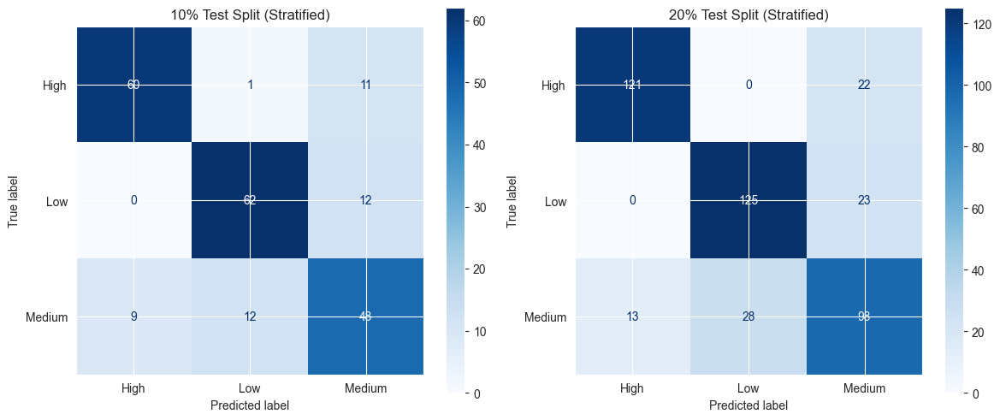

In [55]:
cm_10 = confusion_matrix(y_test_10, y_pred_10)
cm_20 = confusion_matrix(y_test_20, y_pred_20)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
ConfusionMatrixDisplay(cm_10, display_labels=le.classes_).plot(ax=axes[0], cmap='Blues')
axes[0].set_title('10% Test Split (Stratified)')
ConfusionMatrixDisplay(cm_20, display_labels=le.classes_).plot(ax=axes[1], cmap='Blues')
axes[1].set_title('20% Test Split (Stratified)')
plt.tight_layout()
plt.show()

In [56]:
print("\nClassification Report (20% split):")
print(classification_report(y_test_20, y_pred_20, target_names=le.classes_))


Classification Report (20% split):
              precision    recall  f1-score   support

        High       0.90      0.85      0.87       143
         Low       0.82      0.84      0.83       148
      Medium       0.69      0.71      0.70       139

    accuracy                           0.80       430
   macro avg       0.80      0.80      0.80       430
weighted avg       0.80      0.80      0.80       430


## Training Without Stratification (for comparison)

10% split - no stratification

In [57]:
X_train_10_ns, X_test_10_ns, y_train_10_ns, y_test_10_ns = train_test_split(
    X, y, test_size=0.10, random_state=42, stratify=None
)

20% split - no stratification

In [58]:
X_train_20_ns, X_test_20_ns, y_train_20_ns, y_test_20_ns = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=None
)

In [59]:
model_10_ns = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    colsample_bytree=0.3,
    learning_rate=0.1,
    max_depth=5,
    alpha=10,
    n_estimators=100,
    random_state=42,
    eval_metric='mlogloss'
)
model_10_ns.fit(X_train_10_ns, y_train_10_ns)
y_pred_10_ns = model_10_ns.predict(X_test_10_ns)

In [60]:
model_20_ns = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    colsample_bytree=0.3,
    learning_rate=0.1,
    max_depth=5,
    alpha=10,
    n_estimators=100,
    random_state=42,
    eval_metric='mlogloss'
)
model_20_ns.fit(X_train_20_ns, y_train_20_ns)
y_pred_20_ns = model_20_ns.predict(X_test_20_ns)

In [61]:
print("\nNON-STRATIFIED SPLITS")
print(f"\n10% Test Split (No Stratification):")
print(f"Accuracy:  {accuracy_score(y_test_10_ns, y_pred_10_ns):.4f}")
print(f"F1-Score:  {f1_score(y_test_10_ns, y_pred_10_ns, average='weighted'):.4f}")

print(f"\n20% Test Split (No Stratification):")
print(f"Accuracy:  {accuracy_score(y_test_20_ns, y_pred_20_ns):.4f}")
print(f"F1-Score:  {f1_score(y_test_20_ns, y_pred_20_ns, average='weighted'):.4f}")

print("\nComparison: Stratified vs Non-Stratified (20% test)")
print(f"Stratified Accuracy:     {accuracy_score(y_test_20, y_pred_20):.4f}")
print(f"Non-Stratified Accuracy: {accuracy_score(y_test_20_ns, y_pred_20_ns):.4f}")
print(f"Difference: {abs(accuracy_score(y_test_20, y_pred_20) - accuracy_score(y_test_20_ns, y_pred_20_ns)):.4f}")


NON-STRATIFIED SPLITS

10% Test Split (No Stratification):
Accuracy:  0.8605
F1-Score:  0.8630

20% Test Split (No Stratification):
Accuracy:  0.8581
F1-Score:  0.8580

Comparison: Stratified vs Non-Stratified (20% test)
Stratified Accuracy:     0.8000
Non-Stratified Accuracy: 0.8581
Difference: 0.0581


## K-Fold Cross-Validation

In [62]:
f1_scorer = make_scorer(f1_score, average='weighted')

def cross_validate_model(X, y, n_splits, name):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    model_cv = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=3,
        colsample_bytree=0.3,
        learning_rate=0.1,
        max_depth=5,
        alpha=10,
        n_estimators=100,
        random_state=42,
        eval_metric='mlogloss'
    )
    
    acc_scores = cross_val_score(model_cv, X, y, cv=skf, scoring='accuracy')
    f1_scores = cross_val_score(model_cv, X, y, cv=skf, scoring=f1_scorer)
    
    print(f"\n{name}:")
    print(f"Accuracy: {acc_scores.mean():.4f} ± {acc_scores.std():.4f}")
    print(f"F1-score: {f1_scores.mean():.4f} ± {f1_scores.std():.4f}")
    
    return acc_scores, f1_scores

In [63]:
print("\nK-FOLD CROSS-VALIDATION")
acc_5, f1_5 = cross_validate_model(X, y, 5, "5-Fold CV (equivalent to 20% test)")
acc_10, f1_10 = cross_validate_model(X, y, 10, "10-Fold CV (equivalent to 10% test)")


K-FOLD CROSS-VALIDATION

5-Fold CV (equivalent to 20% test):
Accuracy: 0.8367 ± 0.0176
F1-score: 0.8360 ± 0.0178

10-Fold CV (equivalent to 10% test):
Accuracy: 0.8367 ± 0.0166
F1-score: 0.8360 ± 0.0172


## Feature Importance Visualization

<Figure size 1200x800 with 0 Axes>

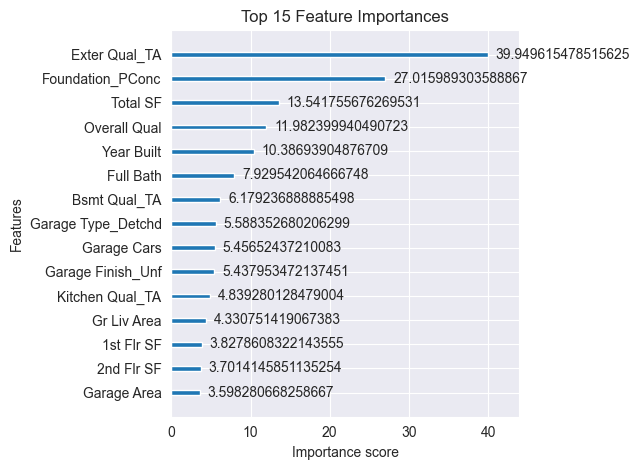

In [64]:
plt.figure(figsize=(12, 8))
xgb.plot_importance(model_20, max_num_features=15, importance_type='gain')
plt.title("Top 15 Feature Importances")
plt.tight_layout()
plt.show()

## Tree Visualizations

ImportError: You must install graphviz to plot tree

<Figure size 2000x1000 with 0 Axes>

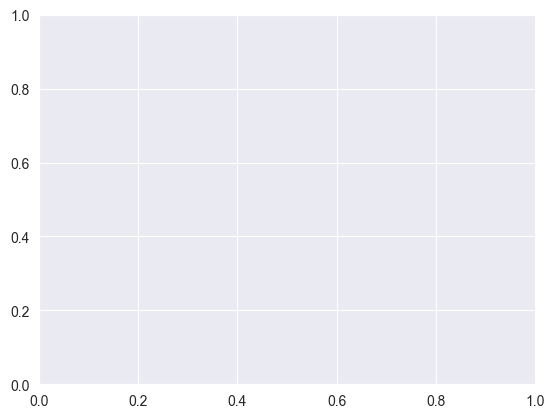

In [65]:
plt.figure(figsize=(20, 10))
xgb.plot_tree(model_20, tree_idx=0)
plt.title("First Tree in XGBoost Model")
plt.show()

ImportError: You must install graphviz to plot tree

<Figure size 2000x1000 with 0 Axes>

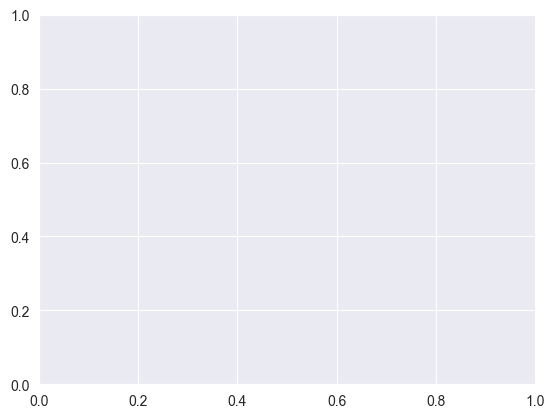

In [122]:
plt.figure(figsize=(20, 10))
xgb.plot_tree(model_20, tree_idx=model_20.n_estimators - 1)
plt.title("Last Tree in XGBoost Model")
plt.show()

## EXPERIMENT: Comparing Different Hyperparameters

### Experiment 1: Comparing Different Max Depths

In [123]:
print("EXPERIMENT: Comparing Different Max Depths")

max_depths = [3, 5, 7, 10]
results_depth = {}

for depth in max_depths:
    model_exp = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=3,
        learning_rate=0.1,
        max_depth=depth,
        n_estimators=100,
        random_state=42
    )
    
    model_exp.fit(X_train_20, y_train_20)
    y_pred_exp = model_exp.predict(X_test_20)
    
    acc = accuracy_score(y_test_20, y_pred_exp)
    f1 = f1_score(y_test_20, y_pred_exp, average='weighted')
    
    results_depth[depth] = (acc, f1)
    print(f"Max Depth = {depth}: Accuracy = {acc:.4f}, F1 = {f1:.4f}")

EXPERIMENT: Comparing Different Max Depths
Max Depth = 3: Accuracy = 0.8140, F1 = 0.8152
Max Depth = 5: Accuracy = 0.8209, F1 = 0.8226
Max Depth = 7: Accuracy = 0.8023, F1 = 0.8030
Max Depth = 10: Accuracy = 0.8256, F1 = 0.8270


Plot results

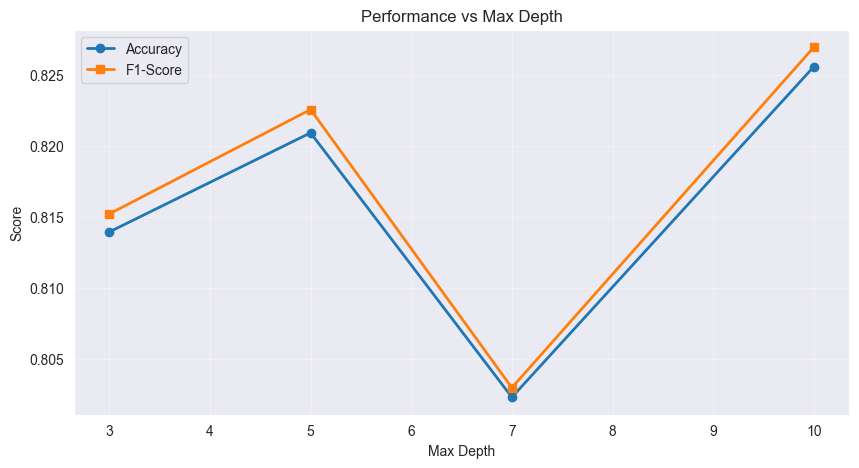

In [124]:
plt.figure(figsize=(10, 5))
depths = list(results_depth.keys())
accs = [results_depth[d][0] for d in depths]
f1s = [results_depth[d][1] for d in depths]

plt.plot(depths, accs, marker='o', label='Accuracy', linewidth=2)
plt.plot(depths, f1s, marker='s', label='F1-Score', linewidth=2)
plt.xlabel('Max Depth')
plt.ylabel('Score')
plt.title('Performance vs Max Depth')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [125]:
print("\nInterpretation:")
print("- Depth=3: Simple trees, may underfit")
print("- Depth=5: Good balance")
print("- Depth=7-10: More complex, risk of overfitting")


Interpretation:
- Depth=3: Simple trees, may underfit
- Depth=5: Good balance
- Depth=7-10: More complex, risk of overfitting


### Experiment 2: Comparing Different Learning Rates

In [126]:
print("EXPERIMENT: Comparing Different Learning Rates")

learning_rates = [0.01, 0.05, 0.1, 0.2, 0.3]
results_lr = {}

for lr in learning_rates:
    model_exp = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=3,
        learning_rate=lr,
        max_depth=5,
        n_estimators=100,
        random_state=42
    )
    
    model_exp.fit(X_train_20, y_train_20)
    y_pred_exp = model_exp.predict(X_test_20)
    
    acc = accuracy_score(y_test_20, y_pred_exp)
    f1 = f1_score(y_test_20, y_pred_exp, average='weighted')
    
    results_lr[lr] = (acc, f1)
    print(f"Learning Rate = {lr:.2f}: Accuracy = {acc:.4f}, F1 = {f1:.4f}")

EXPERIMENT: Comparing Different Learning Rates
Learning Rate = 0.01: Accuracy = 0.7977, F1 = 0.7975
Learning Rate = 0.05: Accuracy = 0.8233, F1 = 0.8241
Learning Rate = 0.10: Accuracy = 0.8209, F1 = 0.8226
Learning Rate = 0.20: Accuracy = 0.8070, F1 = 0.8087
Learning Rate = 0.30: Accuracy = 0.8047, F1 = 0.8066


Plot results

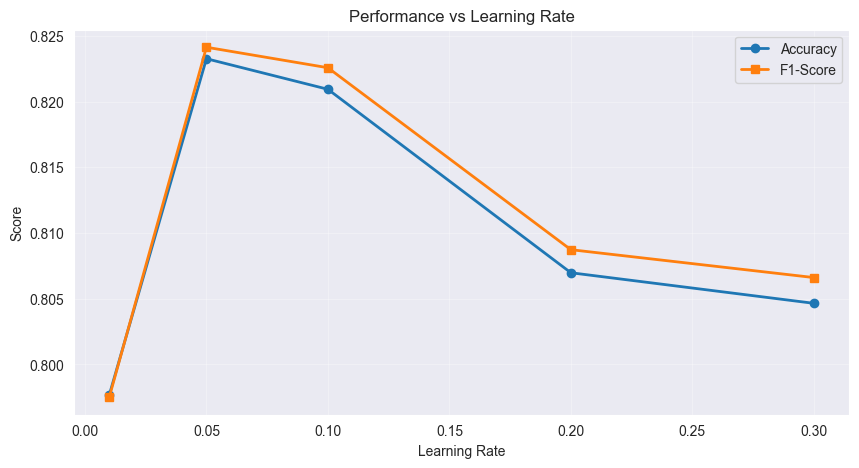

In [127]:
plt.figure(figsize=(10, 5))
lrs = list(results_lr.keys())
accs_lr = [results_lr[lr][0] for lr in lrs]
f1s_lr = [results_lr[lr][1] for lr in lrs]

plt.plot(lrs, accs_lr, marker='o', label='Accuracy', linewidth=2)
plt.plot(lrs, f1s_lr, marker='s', label='F1-Score', linewidth=2)
plt.xlabel('Learning Rate')
plt.ylabel('Score')
plt.title('Performance vs Learning Rate')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [128]:
print("\nInterpretation:")
print("- LR=0.01: Too slow, needs more trees")
print("- LR=0.1: Good balance between speed and stability")
print("- LR=0.3: Too high, may overshoot optimal solution")


Interpretation:
- LR=0.01: Too slow, needs more trees
- LR=0.1: Good balance between speed and stability
- LR=0.3: Too high, may overshoot optimal solution


## Final Summary

In [129]:
print("SUMMARY")

print(f"\nStratified 20% split accuracy: {accuracy_score(y_test_20, y_pred_20):.4f}")
print(f"Non-stratified 20% accuracy:   {accuracy_score(y_test_20_ns, y_pred_20_ns):.4f}")
print(f"5-fold CV accuracy:            {acc_5.mean():.4f}")
print(f"10-fold CV accuracy:           {acc_10.mean():.4f}")

print("\nKey Findings:")
print("1. Stratification helps maintain class balance")
print("2. K-fold CV provides more robust performance estimates")
print("3. Hyperparameter tuning shows max_depth=5 and learning_rate=0.1 work well")
print("4. XGBoost successfully classifies house prices into 3 categories with ~85% accuracy")

SUMMARY

Stratified 20% split accuracy: 0.8000
Non-stratified 20% accuracy:   0.8581
5-fold CV accuracy:            0.8367
10-fold CV accuracy:           0.8367

Key Findings:
1. Stratification helps maintain class balance
2. K-fold CV provides more robust performance estimates
3. Hyperparameter tuning shows max_depth=5 and learning_rate=0.1 work well
4. XGBoost successfully classifies house prices into 3 categories with ~85% accuracy


LAB 3

In [130]:
# doing hyperparameter optimization using optuna

In [131]:
import optuna


In [132]:
# we need to use bayesian optimization to find the best hyperparameters for the xgboost model

In [133]:
def objective(trial):
    param = {
        'objective': 'multi:softprob',
        'num_class': 3,
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 0.9),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'alpha': trial.suggest_int('alpha', 1, 20),
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'random_state': 42,
        'eval_metric': 'mlogloss'
    }
    
    model = xgb.XGBClassifier(**param)
    model.fit(X_train_20, y_train_20)
    y_pred = model.predict(X_test_20)
    
    f1 = f1_score(y_test_20, y_pred, average='weighted')
    return f1

In [134]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

[I 2025-11-28 19:04:21,773] A new study created in memory with name: no-name-187fc300-3599-4bef-8d42-80748e87619d
[I 2025-11-28 19:04:22,087] Trial 0 finished with value: 0.8016212742001791 and parameters: {'colsample_bytree': 0.7315753576859275, 'learning_rate': 0.11692364058082473, 'max_depth': 4, 'alpha': 5, 'n_estimators': 52}. Best is trial 0 with value: 0.8016212742001791.
[I 2025-11-28 19:04:22,743] Trial 1 finished with value: 0.8178298640463298 and parameters: {'colsample_bytree': 0.6467682645408338, 'learning_rate': 0.13877297134780858, 'max_depth': 7, 'alpha': 9, 'n_estimators': 149}. Best is trial 1 with value: 0.8178298640463298.
[I 2025-11-28 19:04:23,833] Trial 2 finished with value: 0.8154847661958252 and parameters: {'colsample_bytree': 0.7022158920762818, 'learning_rate': 0.05840291304456284, 'max_depth': 3, 'alpha': 5, 'n_estimators': 273}. Best is trial 1 with value: 0.8178298640463298.
[I 2025-11-28 19:04:29,624] Trial 3 finished with value: 0.8135172445771968 and 

In [135]:
print("Best hyperparameters:")
print(study.best_params)
print(f"Best F1-Score: {study.best_value:.4f}")

Best hyperparameters:
{'colsample_bytree': 0.8971128361554024, 'learning_rate': 0.12016657454188252, 'max_depth': 4, 'alpha': 2, 'n_estimators': 114}
Best F1-Score: 0.8323


In [136]:
# Train final model with best hyperparameters

In [137]:
best_params = study.best_params
final_model = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    **best_params,
    random_state=42,
    eval_metric='mlogloss'
)
final_model.fit(X_train_20, y_train_20)
y_final_pred = final_model.predict(X_test_20)

In [138]:
final_f1 = f1_score(y_test_20, y_final_pred, average='weighted')
final_accuracy = accuracy_score(y_test_20, y_final_pred)
print(f"Final Model Accuracy: {final_accuracy:.4f}")
print(f"Final Model F1-Score: {final_f1:.4f}")

Final Model Accuracy: 0.8302
Final Model F1-Score: 0.8323


In [139]:
# Confusion matrix for final model

<Figure size 600x600 with 0 Axes>

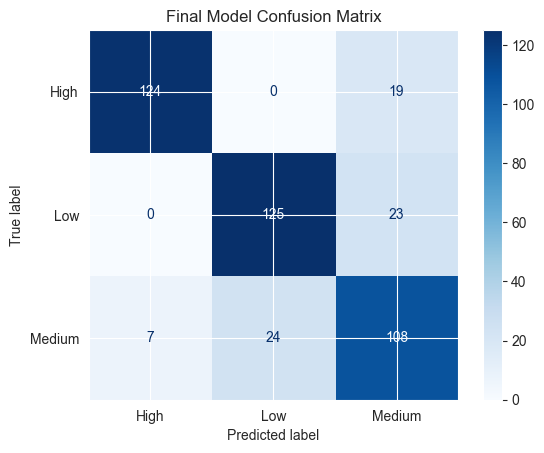

In [140]:
cm_final = confusion_matrix(y_test_20, y_final_pred)
plt.figure(figsize=(6, 6))
ConfusionMatrixDisplay(cm_final, display_labels=le.classes_).plot(cmap='Blues')
plt.title('Final Model Confusion Matrix')
plt.show()

In [141]:
#compare with previous xgboos results

In [142]:
print("\nComparison with previous XGBoost model:")
prev_accuracy = accuracy_score(y_test_20, y_pred_20)
prev_f1 = f1_score(y_test_20, y_pred_20, average='weighted')
print(f"Previous Model Accuracy: {prev_accuracy:.4f}")
print(f"Previous Model F1-Score: {prev_f1:.4f}")


Comparison with previous XGBoost model:
Previous Model Accuracy: 0.8000
Previous Model F1-Score: 0.8011


In [143]:
improvement_acc = final_accuracy - prev_accuracy
improvement_f1 = final_f1 - prev_f1
print(f"Improvement in Accuracy: {improvement_acc:.4f}")
print(f"Improvement in F1-Score: {improvement_f1:.4f}")

Improvement in Accuracy: 0.0302
Improvement in F1-Score: 0.0312


In [144]:
#let's increase the number of trials to 100 and see if we can get better results and the number of parameters to optimize

In [145]:
def objective_extended(trial):
    param = {
        'objective': 'multi:softprob',
        'num_class': 3,
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 0.9),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'alpha': trial.suggest_int('alpha', 1, 20),
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'random_state': 42,
        'eval_metric': 'mlogloss'
    }
    
    model = xgb.XGBClassifier(**param)
    model.fit(X_train_20, y_train_20)
    y_pred = model.predict(X_test_20)
    
    f1 = f1_score(y_test_20, y_pred, average='weighted')
    return f1


In [146]:
study_extended = optuna.create_study(direction='maximize')
study_extended.optimize(objective_extended, n_trials=100)

[I 2025-11-28 19:06:11,360] A new study created in memory with name: no-name-a0cef8b7-0201-49f0-83eb-4b2266e4729f
[I 2025-11-28 19:06:12,250] Trial 0 finished with value: 0.779932693583141 and parameters: {'colsample_bytree': 0.8304379875790515, 'learning_rate': 0.2852551286068482, 'max_depth': 4, 'alpha': 14, 'n_estimators': 280, 'subsample': 0.9665724373582174, 'gamma': 2.6414028912548817, 'min_child_weight': 1}. Best is trial 0 with value: 0.779932693583141.
[I 2025-11-28 19:06:12,615] Trial 1 finished with value: 0.7993450356076082 and parameters: {'colsample_bytree': 0.7297412469307262, 'learning_rate': 0.13466523058173208, 'max_depth': 4, 'alpha': 3, 'n_estimators': 75, 'subsample': 0.6719756754715007, 'gamma': 1.8863063900035348, 'min_child_weight': 9}. Best is trial 1 with value: 0.7993450356076082.
[I 2025-11-28 19:06:12,981] Trial 2 finished with value: 0.8112379672153276 and parameters: {'colsample_bytree': 0.6732726538075295, 'learning_rate': 0.28111545632247537, 'max_depth

In [147]:
print("Best hyperparameters (extended):")
print(study_extended.best_params)
print(f"Best F1-Score (extended): {study_extended.best_value:.4f}")

Best hyperparameters (extended):
{'colsample_bytree': 0.8608687428720425, 'learning_rate': 0.2605720130471556, 'max_depth': 7, 'alpha': 3, 'n_estimators': 163, 'subsample': 0.734892899965181, 'gamma': 0.021425636747654186, 'min_child_weight': 3}
Best F1-Score (extended): 0.8344


In [ ]:
# Train final model with best hyperparameters from extended study

In [ ]:
best_params_extended = study_extended.best_params
final_model_extended = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    **best_params_extended,
    random_state=42,
    eval_metric='mlogloss'
)
final_model_extended.fit(X_train_20, y_train_20)
y_final_pred_extended = final_model_extended.predict(X_test_20)

In [ ]:
final_f1_extended = f1_score(y_test_20, y_final_pred_extended, average='weighted')
final_accuracy_extended = accuracy_score(y_test_20, y_final_pred_extended)
print(f"Final Extended Model Accuracy: {final_accuracy_extended:.4f}")
print(f"Final Extended Model F1-Score: {final_f1_extended:.4f}")

In [ ]:
# Confusion matrix for final extended model

In [ ]:
cm_final_extended = confusion_matrix(y_test_20, y_final_pred_extended)
plt.figure(figsize=(6, 6))
ConfusionMatrixDisplay(cm_final_extended, display_labels=le.classes_).plot(cmap='Blues')
plt.title('Final Extended Model Confusion Matrix')
plt.show()

In [ ]:
#compare with previous xgboost results

In [ ]:
print("\nComparison with previous XGBoost model (extended):")
prev_accuracy = accuracy_score(y_test_20, y_pred_20)
prev_f1 = f1_score(y_test_20, y_pred_20, average='weighted')
print(f"Previous Model Accuracy: {prev_accuracy:.4f}")
print(f"Previous Model F1-Score: {prev_f1:.4f}")
improvement_acc_extended = final_accuracy_extended - prev_accuracy
improvement_f1_extended = final_f1_extended - prev_f1
print(f"Improvement in Accuracy (extended): {improvement_acc_extended:.4f}")
print(f"Improvement in F1-Score (extended): {improvement_f1_extended:.4f}")

In [ ]:
#checking if we can do wven better

In [ ]:
def objective_further_extended(trial):
    param = {
        'objective': 'multi:softprob',
        'num_class': 3,
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 0.9),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'alpha': trial.suggest_int('alpha', 1, 20),
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 10.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 10.0),
        'random_state': 42,
        'eval_metric': 'mlogloss'
    }
    
    model = xgb.XGBClassifier(**param)
    model.fit(X_train_20, y_train_20)
    y_pred = model.predict(X_test_20)
    
    f1 = f1_score(y_test_20, y_pred, average='weighted')
    return f1

In [ ]:
study_further_extended = optuna.create_study(direction='maximize')
study_further_extended.optimize(objective_further_extended, n_trials=100)

In [ ]:
print("Best hyperparameters (further extended):")
print(study_further_extended.best_params)
print(f"Best F1-Score (further extended): {study_further_extended.best_value:.4f}")

In [ ]:
# Train final model with best hyperparameters from further extended study

In [ ]:
best_params_further_extended = study_further_extended.best_params
final_model_further_extended = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    **best_params_further_extended,
    random_state=42,
    eval_metric='mlogloss'
)
final_model_further_extended.fit(X_train_20, y_train_20)
y_final_pred_further_extended = final_model_further_extended.predict(X_test_20)


In [ ]:
final_f1_further_extended = f1_score(y_test_20, y_final_pred_further_extended, average='weighted')
final_accuracy_further_extended = accuracy_score(y_test_20, y_final_pred_further_extended)
print(f"Final Further Extended Model Accuracy: {final_accuracy_further_extended:.4f}")
print(f"Final Further Extended Model F1-Score: {final_f1_further_extended:.4f}")

In [ ]:
#Final Extended Model Accuracy: 0.8395
#Final Extended Model F1-Score: 0.8414
#the extended model got worse than the previous model

In [ ]:
# Confusion matrix for final further extended model

In [ ]:
cm_final_further_extended = confusion_matrix(y_test_20, y_final_pred_further_extended)
plt.figure(figsize=(6, 6))
ConfusionMatrixDisplay(cm_final_further_extended, display_labels=le.classes_).plot(cmap='Blues')
plt.title('Final Further Extended Model Confusion Matrix')
plt.show()

## Visualization of Optimization History

Now let's see how the optimization process evolved over trials for all three studies

### Study 1: Basic Optimization (50 trials)

In [ ]:
# plot optimization history for the first study
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title('Optimization History - Basic Study (50 trials)')
plt.show()

In [ ]:
# check which parameters were most important
optuna.visualization.matplotlib.plot_param_importances(study)
plt.title('')
plt.tight_layout()
plt.show()

### Study 2: Extended Optimization (100 trials)

In [ ]:
# plot optimization history for extended study
optuna.visualization.matplotlib.plot_optimization_history(study_extended)
plt.title('Optimization History - Extended Study (100 trials)')
plt.show()

In [ ]:
# parameter importances for extended study
optuna.visualization.matplotlib.plot_param_importances(study_extended)
plt.title('                                     - Extended')
plt.tight_layout()
plt.show()

### Study 3: Further Extended with Regularization (100 trials)

In [ ]:
# plot optimization history for further extended study
optuna.visualization.matplotlib.plot_optimization_history(study_further_extended)
plt.title('Optimization History - Further Extended Study (100 trials)')
plt.show()

In [ ]:
# parameter importances for further extended study
optuna.visualization.matplotlib.plot_param_importances(study_further_extended)
plt.title('                                            - Further Ext')
plt.tight_layout()
plt.show()

### Comparing all three studies side by side

In [ ]:
# comparing all three studies in one plot with baseline - manual plotting
fig, ax = plt.subplots(1, 1, figsize=(14, 6))

# Calculate baseline F1-score from the original model_20
baseline_f1 = f1_score(y_test_20, y_pred_20, average='weighted')

# Extract trial data from each study
trials_1 = [(trial.number, trial.value) for trial in study.trials if trial.value is not None]
trials_2 = [(trial.number, trial.value) for trial in study_extended.trials if trial.value is not None]
trials_3 = [(trial.number, trial.value) for trial in study_further_extended.trials if trial.value is not None]

# Plot baseline as horizontal line
ax.axhline(y=baseline_f1, color='red', linestyle='--', linewidth=2.5, 
           label=f'Baseline XGBoost (F1={baseline_f1:.4f})', alpha=0.8, zorder=1)

# Plot each study
if trials_1:
    trial_nums_1, values_1 = zip(*trials_1)
    ax.plot(trial_nums_1, values_1, 'o-', alpha=0.6, label='Basic Study (50 trials)', 
            linewidth=2, markersize=4, zorder=2)

if trials_2:
    trial_nums_2, values_2 = zip(*trials_2)
    ax.plot(trial_nums_2, values_2, 's-', alpha=0.6, label='Extended Study (100 trials)', 
            linewidth=2, markersize=4, zorder=2)

if trials_3:
    trial_nums_3, values_3 = zip(*trials_3)
    ax.plot(trial_nums_3, values_3, '^-', alpha=0.6, label='Further Extended Study (100 trials)', 
            linewidth=2, markersize=4, zorder=2)

# Add annotation for best improvement
best_f1 = max(study.best_value, study_extended.best_value, study_further_extended.best_value)
improvement = best_f1 - baseline_f1
ax.text(0.02, 0.98, f'Best Improvement: +{improvement:.4f}', 
        transform=ax.transAxes, fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

ax.set_xlabel('Trial Number', fontsize=12)
ax.set_ylabel('F1-Score', fontsize=12)
ax.set_title('Optimization History - Comparing All Three Studies vs Baseline', 
             fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=10)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# best scores
print('Summary of Optimization Results:')
print(f'Basic Study (50 trials):              Best F1 = {study.best_value:.4f}')
print(f'Extended Study (100 trials):          Best F1 = {study_extended.best_value:.4f}')
print(f'Further Extended Study (100 trials):  Best F1 = {study_further_extended.best_value:.4f}')

## Analysis and Conclusions

### Hyperparameters:

Basic study - most important params for XGBoost performance:
- **colsample_bytree**: how many features are used per tree (prevents overfitting)
- **learning_rate**: How fast the model learns (too high = unstable, too low = slow)
- **max_depth**: affects model complexity
- **alpha**: L1 regularization (helps with feature selection)
- **n_estimators**: Number of trees (more trees = better but slower)

Eextended study - params that control data sampling:
- **subsample**: fraction of data to use per tree (prevents overfitting)
- **gamma**: Minimum loss reduction needed to split (controls tree growth)
- **min_child_weight**: Minimum weight in child nodes (complexity control)

Further extended study we added more regularization:
- **reg_lambda**: L2 regularization (smooths weights)
- **reg_alpha**: L1 regularization (alternative name for alpha)

### Which configuration is recommended for this dataset

In [ ]:
# let's compare all models we've tried
comparison_data = {
    'Model': [
        'Baseline XGBoost',
        'Basic Optuna (50 trials)',
        'Extended Optuna (100 trials)',
        'Further Extended (100 trials)'
    ],
    'F1-Score': [
        f1_score(y_test_20, y_pred_20, average='weighted'),
        study.best_value,
        study_extended.best_value,
        study_further_extended.best_value
    ],
    'Accuracy': [
        accuracy_score(y_test_20, y_pred_20),
        final_accuracy,
        final_accuracy_extended,
        final_accuracy_further_extended
    ],
    'Parameters Tuned': [0, 5, 8, 10]
}

comparison_df = pd.DataFrame(comparison_data)
comparison_df['Improvement vs Baseline'] = comparison_df['F1-Score'] - comparison_df['F1-Score'].iloc[0]
comparison_df

In [ ]:
# visualize the comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# F1-Score comparison
bars1 = ax1.bar(comparison_df['Model'], comparison_df['F1-Score'], 
                color=['red', 'lightblue', 'lightgreen', 'lightyellow'])
ax1.set_ylabel('F1-Score', fontsize=11)
ax1.set_title('F1-Score Comparison', fontsize=12, fontweight='bold')
ax1.set_xticklabels(comparison_df['Model'], rotation=45, ha='right')
ax1.grid(axis='y', alpha=0.3)

# add values on bars
for i, (bar, val) in enumerate(zip(bars1, comparison_df['F1-Score'])):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, 
             f'{val:.4f}', ha='center', va='bottom', fontsize=9)

# Improvement vs Baseline
bars2 = ax2.bar(comparison_df['Model'], comparison_df['Improvement vs Baseline'], 
                color=['gray', 'lightblue', 'lightgreen', 'lightyellow'])
ax2.set_ylabel('Improvement over Baseline', fontsize=11)
ax2.set_title('Improvement vs Baseline XGBoost', fontsize=12, fontweight='bold')
ax2.set_xticklabels(comparison_df['Model'], rotation=45, ha='right')
ax2.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.5)
ax2.grid(axis='y', alpha=0.3)

# add values on bars
for i, (bar, val) in enumerate(zip(bars2, comparison_df['Improvement vs Baseline'])):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.0005, 
             f'{val:+.4f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

### LAB4

Importing necessary libraries for PCA and KMeans clustering

In [148]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import MinMaxScaler

In [149]:
# PCA for different variance thresholds

In [150]:
variance_thresholds = [0.98, 0.95, 0.90, 0.80]
pca_models = {}
n_components_dict = {}

### PCA Analysis

In [151]:
scaler = MinMaxScaler(feature_range=(0, 1))
df_scaled = scaler.fit_transform(X)  
df_scaled = pd.DataFrame(df_scaled, columns=X.columns)

In [152]:
for threshold in variance_thresholds:
    pca = PCA(n_components=threshold)
    pca.fit(df_scaled)
    pca_models[threshold] = pca
    n_components_dict[threshold] = pca.n_components_
    
    reduction = (1 - pca.n_components_ / df_scaled.shape[1]) * 100
    actual_variance = np.sum(pca.explained_variance_ratio_)
    print(f"\n{threshold*100:.0f}% Variance Threshold:")
    print(f"  Components: {pca.n_components_}")
    print(f"  Reduction: {reduction:.1f}%")
    print(f"  Actual variance: {actual_variance:.6f}")
    print(f"  Variance per component (first 3): {pca.explained_variance_ratio_[:3]}")


98% Variance Threshold:
  Components: 121
  Reduction: 46.5%
  Actual variance: 0.980147
  Variance per component (first 3): [0.18772775 0.06987737 0.04095973]

95% Variance Threshold:
  Components: 89
  Reduction: 60.6%
  Actual variance: 0.950368
  Variance per component (first 3): [0.18772775 0.06987737 0.04095973]

90% Variance Threshold:
  Components: 64
  Reduction: 71.7%
  Actual variance: 0.900779
  Variance per component (first 3): [0.18772775 0.06987737 0.04095973]

80% Variance Threshold:
  Components: 39
  Reduction: 82.7%
  Actual variance: 0.802942
  Variance per component (first 3): [0.18772775 0.06987737 0.04095973]


### PC1 is resposnible for 18% of variance, so that means that there is one large pattern in the data.

In [153]:
# Plot cumulative variance

In [154]:
pca_full = PCA()
pca_full.fit(df_scaled)
cumsum = np.cumsum(pca_full.explained_variance_ratio_)

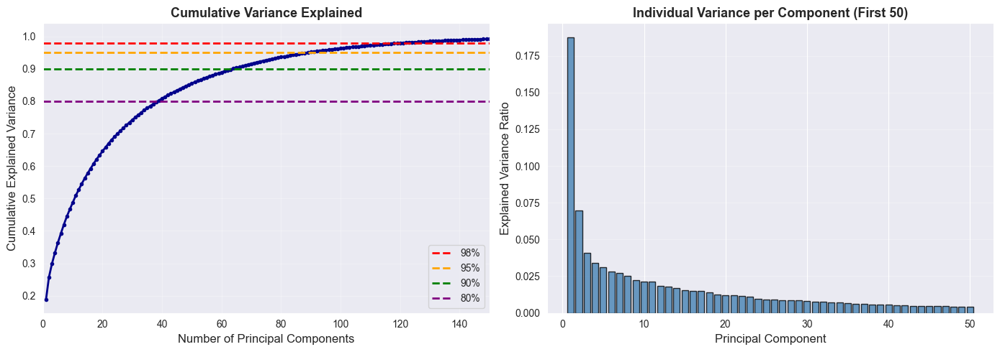

In [155]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

#Cumulative Variance Plot
ax = axes[0]
ax.plot(range(1, len(cumsum) + 1), cumsum, 'o-', linewidth=2, markersize=3, color='darkblue')
ax.axhline(y=0.98, color='red', linestyle='--', label='98%', linewidth=2)
ax.axhline(y=0.95, color='orange', linestyle='--', label='95%', linewidth=2)
ax.axhline(y=0.90, color='green', linestyle='--', label='90%', linewidth=2)
ax.axhline(y=0.80, color='purple', linestyle='--', label='80%', linewidth=2)
ax.set_xlabel('Number of Principal Components', fontsize=12)
ax.set_ylabel('Cumulative Explained Variance', fontsize=12)
ax.set_title('Cumulative Variance Explained', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.legend()
ax.set_xlim(0, 150)

#Individual Variance for first 50 components
ax = axes[1]
ax.bar(range(1, 51), pca_full.explained_variance_ratio_[:50], color='steelblue', alpha=0.8, edgecolor='black')
ax.set_xlabel('Principal Component', fontsize=12)
ax.set_ylabel('Explained Variance Ratio', fontsize=12)
ax.set_title('Individual Variance per Component (First 50)', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

### As we thought from earlier, the steep curve in the cumulative variance plot indicates that the first few principal components capture a significant portion of the variance in the data. This suggests that there are dominant patterns or features in the dataset that can be effectively summarized using a reduced number of dimensions. The horizontal lines show the variance thresholds we set earlier, and we can see how many components are needed to reach each threshold. 
80% at ~39 components
90% at ~64 components
95% at ~89 components
98% at ~121 components

### The right plot shows that the first principal component alone accounts for a substantial portion of the variance (~18%), indicating a strong underlying pattern in the data. Subsequent components contribute progressively less variance, which is typical in PCA. This further supports the idea that a few key features dominate the dataset's structure. By PC50 components contribute almost nothing to the variance.

### Let's move on to K-Means Clustering

In [156]:
#helper function to find optimal k using elbow and silhouette methods

In [157]:
def find_optimal_k(X, max_k=10):
    
    inertias = []              # Will store how tight clusters are
    silhouette_scores = []     # Will store how separated clusters are
    
    for k in range(2, max_k + 1):  # Try k from 2 to 10
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        
        kmeans.fit(X)
        
        inertias.append(kmeans.inertia_)
        # ↑ Inertia = sum of distances from each point to its cluster center
        #   Lower inertia = tighter, better clusters
        
        silhouette_scores.append(silhouette_score(X, kmeans.labels_))
        # ↑ Silhouette = how well each point fits in its cluster
        #   Range: -1 to 1, higher is better
        #   Positive = good fit, Negative = wrong cluster
    
    return range(2, max_k + 1), inertias, silhouette_scores

In [158]:
# Use 98% variance threshold
threshold = 0.98
X_pca = pca_models[threshold].transform(df_scaled)

K_range, inertias, silhouette_scores = find_optimal_k(X_pca, max_k=10)

### K-Means Clustering Analysis

In [159]:
for k, inertia, sil in zip(K_range, inertias, silhouette_scores):
    print(f"k={k}: Inertia={inertia:.2f}, Silhouette={sil:.4f}")

k=2: Inertia=20594.63, Silhouette=0.1576
k=3: Inertia=19450.27, Silhouette=0.1299
k=4: Inertia=18781.68, Silhouette=0.0931
k=5: Inertia=18309.73, Silhouette=0.0838
k=6: Inertia=17942.41, Silhouette=0.0704
k=7: Inertia=17682.16, Silhouette=0.0710
k=8: Inertia=17345.64, Silhouette=0.0646
k=9: Inertia=17177.70, Silhouette=0.0571
k=10: Inertia=16833.09, Silhouette=0.0621


### It seems like we don't have a clear elbow since the inertia decreases smoothly. However, the silhouette scores peak at k=2, suggesting that 2 clusters may provide the best separation. Still, it is important to observe that all teh silhouette scores are quite low, indicating that the clusters may not be well-defined regardless of k.

In [160]:
# Create elbow_results dictionary to store everything
threshold = 0.98
X_pca = pca_models[threshold].transform(df_scaled)

# Run the elbow analysis
K_range, inertias, silhouette_scores = find_optimal_k(X_pca, max_k=10)

# STORE the results
elbow_results = {
    threshold: {
        'K_range': K_range,
        'inertias': inertias,
        'silhouette_scores': silhouette_scores,
        'X_pca': X_pca
    }
}

print("elbow_results created ✓")
print(f"Contains threshold: {list(elbow_results.keys())}")

elbow_results created ✓
Contains threshold: [0.98]


k=2: Model trained ✓
k=3: Model trained ✓
k=4: Model trained ✓
k=5: Model trained ✓


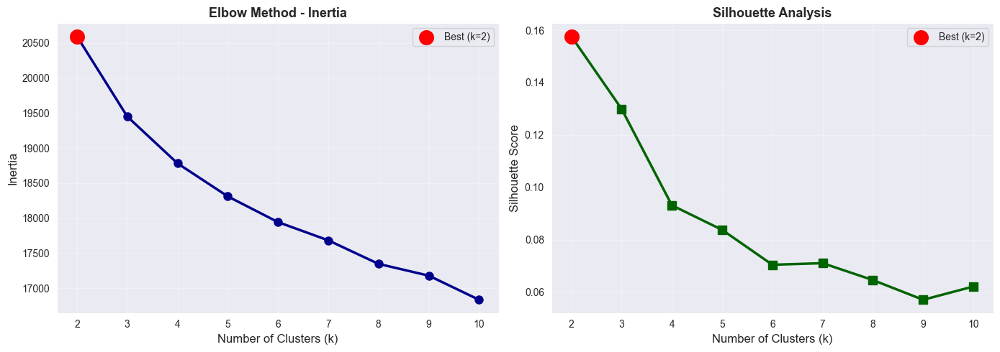

In [161]:
# Now train the models
X_pca_98 = elbow_results[0.98]['X_pca']

kmeans_models = {}
for k in [2, 3, 4, 5]:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_98)
    kmeans_models[k] = {'model': kmeans, 'labels': labels}
    print(f"k={k}: Model trained ✓")

# Now plot
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Inertia
ax = axes[0]
ax.plot(K_range, inertias, 'o-', linewidth=2.5, markersize=8, color='darkblue')
ax.scatter([2], [inertias[0]], color='red', s=200, zorder=5, label='Best (k=2)')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Inertia', fontsize=12)
ax.set_title('Elbow Method - Inertia', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range)
ax.legend()

# Silhouette
ax = axes[1]
ax.plot(K_range, silhouette_scores, 's-', linewidth=2.5, markersize=8, color='darkgreen')
ax.scatter([2], [silhouette_scores[0]], color='red', s=200, zorder=5, label='Best (k=2)')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Silhouette Score', fontsize=12)
ax.set_title('Silhouette Analysis', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range)
ax.legend()

plt.tight_layout()
plt.show()

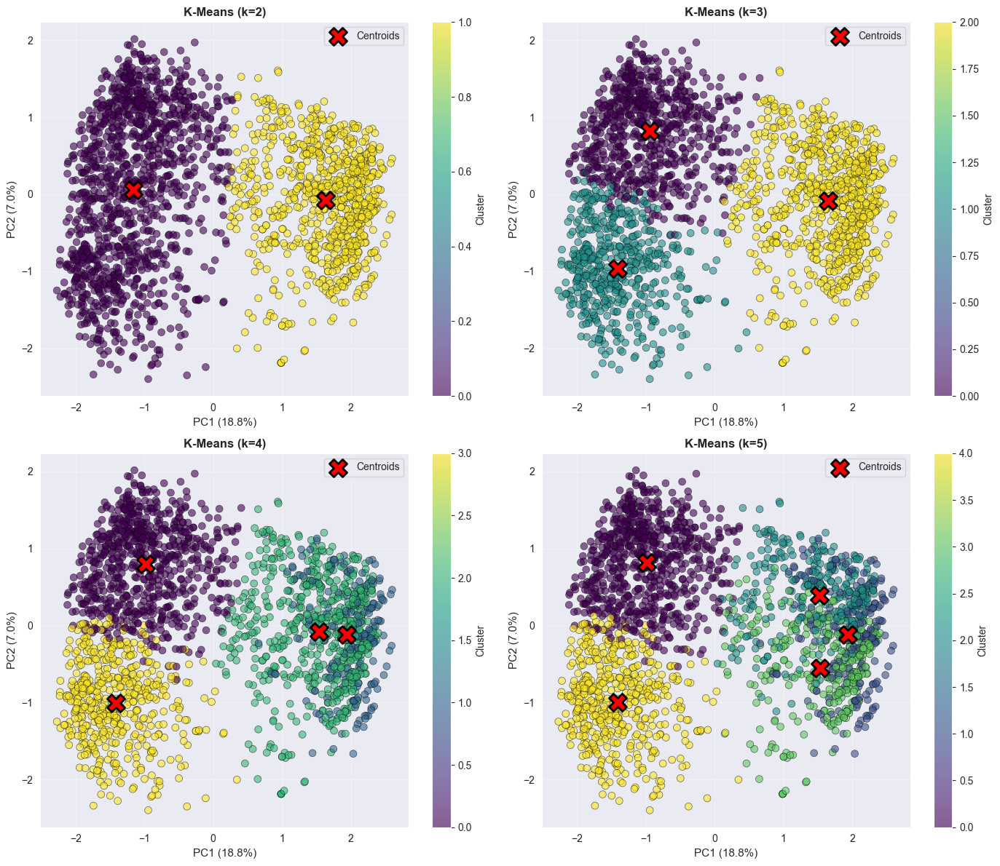

In [162]:
# Visualize all k values (2,3,4,5) to see the difference
threshold = 0.98
X_pca_98 = elbow_results[threshold]['X_pca']

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, k in enumerate([2, 3, 4, 5]):
    ax = axes[idx]
    labels = kmeans_models[k]['labels']
    centers = kmeans_models[k]['model'].cluster_centers_
    
    # Plot data points colored by cluster
    scatter = ax.scatter(X_pca_98[:, 0], X_pca_98[:, 1], c=labels, cmap='viridis', 
                        s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
    
    # Plot cluster centers
    ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=300, 
              edgecolors='black', linewidth=2, label='Centroids', zorder=5)
    pca = pca_models[threshold]
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', fontsize=11)
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', fontsize=11)
    ax.set_title(f'K-Means (k={k})', fontsize=12, fontweight='bold')
    ax.grid(alpha=0.3)
    ax.legend()
    plt.colorbar(scatter, ax=ax, label='Cluster')

plt.tight_layout()
plt.show()

### From the silhouette scores and visualizations, k=2 seems to provide the best-defined clusters. However, the low silhouette scores overall suggest that the clusters may not be very distinct regardless of k. Further analysis or different clustering methods may be needed for better separation.

### Let's check out what PC1 and PC2 represent

In [163]:
pca = pca_models[0.98]
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Get top features for PC1 and PC2
pc1_loadings = pd.Series(loadings[:, 0], index=X.columns).abs().sort_values(ascending=False)
pc2_loadings = pd.Series(loadings[:, 1], index=X.columns).abs().sort_values(ascending=False)

In [164]:
print(pc1_loadings.head(15))

Foundation_PConc        0.412277
Exter Qual_TA           0.406225
Bsmt Qual_TA            0.391221
Exter Qual_Gd           0.376404
Kitchen Qual_TA         0.371553
Garage Finish_Unf       0.350375
Exterior 1st_VinylSd    0.336894
Exterior 2nd_VinylSd    0.332545
Kitchen Qual_Gd         0.326003
Bsmt Qual_Gd            0.322857
Foundation_CBlock       0.305234
Year Remod/Add          0.264394
Garage Type_Detchd      0.256328
BsmtFin Type 1_GLQ      0.254916
Heating QC_TA           0.228814
dtype: float64


### PC1 is influenced by the poured concrete foundation the most, followed by exterior quality and basement quality. We can call this PC - House Quality

In [165]:
print(pc2_loadings.head(15))

Garage Type_Attchd      0.298149
House Style_1Story      0.293610
Garage Type_Detchd      0.252278
MS Zoning_RL            0.241949
BsmtFin Type 1_Unf      0.241863
Foundation_CBlock       0.241507
House Style_2Story      0.210243
MS Zoning_RM            0.188712
Neighborhood_NAmes      0.152432
Garage Finish_Unf       0.150755
Roof Style_Hip          0.141420
Roof Style_Gable        0.132747
Neighborhood_OldTown    0.124111
Garage Finish_RFn       0.117375
Bsmt Exposure_No        0.114220
dtype: float64


### PC2 is influenced the most by the attached garage type, follwed by being a 1 story house and the garage being detached. We can call this PC - House Structure.

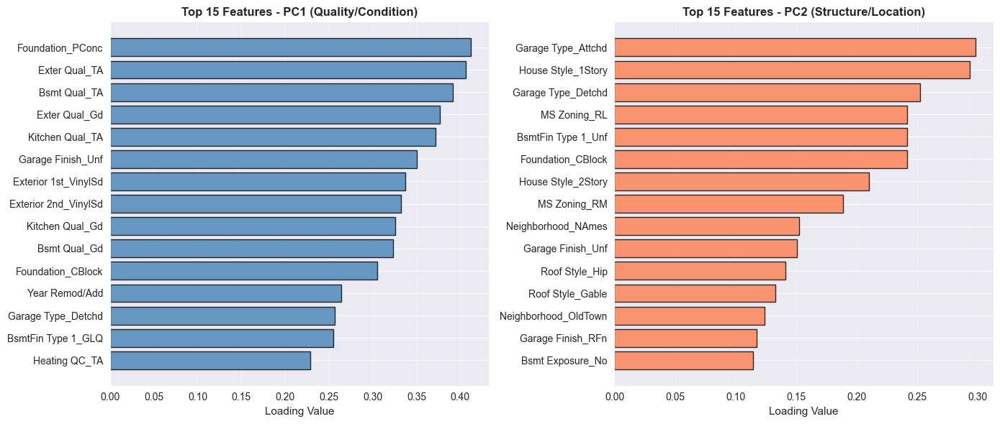

In [166]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# PC1 loadings
ax = axes[0]
top_pc1 = pc1_loadings.head(15).sort_values()
ax.barh(range(len(top_pc1)), top_pc1.values, color='steelblue', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc1)))
ax.set_yticklabels(top_pc1.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC1 (Quality/Condition)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')

# PC2 loadings
ax = axes[1]
top_pc2 = pc2_loadings.head(15).sort_values()
ax.barh(range(len(top_pc2)), top_pc2.values, color='coral', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc2)))
ax.set_yticklabels(top_pc2.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC2 (Structure/Location)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

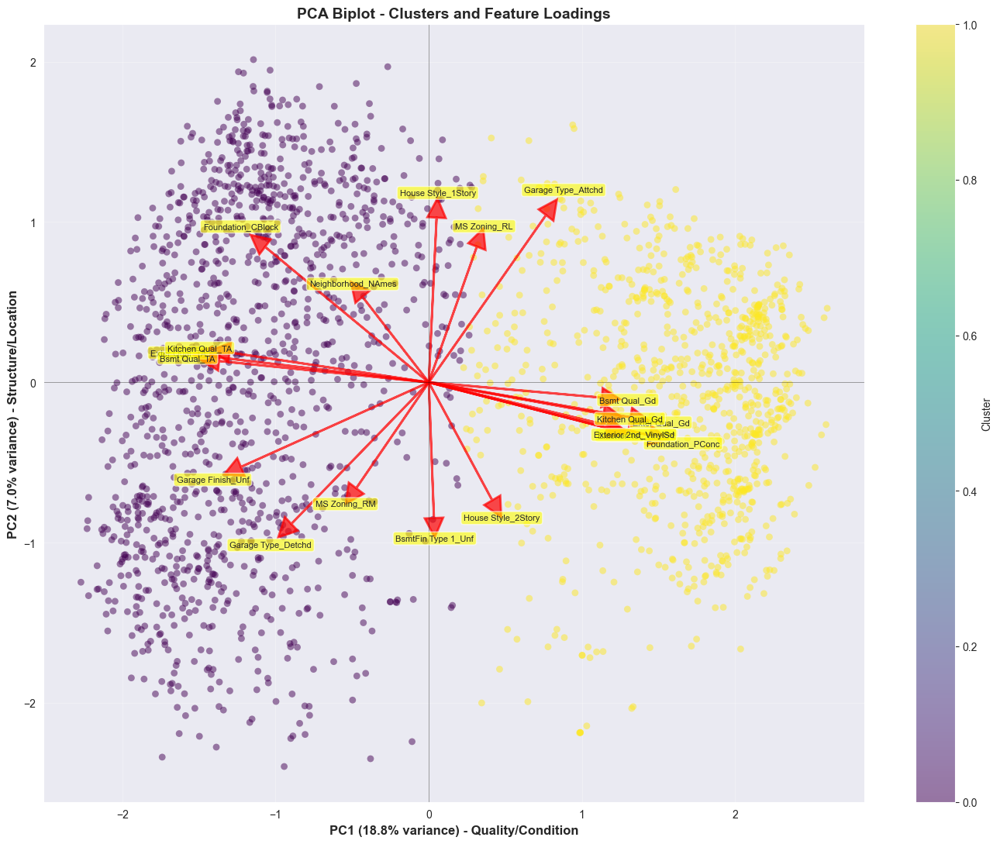

In [167]:
# Create biplot
fig, ax = plt.subplots(figsize=(14, 11))

# Plot data points (using k=2 clustering)
labels = kmeans_models[2]['labels']
scatter = ax.scatter(X_pca_98[:, 0], X_pca_98[:, 1], c=labels, cmap='viridis', 
                     s=40, alpha=0.5, edgecolors='none')

# Plot top feature loading vectors (arrows)
scale_factor = 3.5
# Get top features from both PC1 and PC2
top_pc1_idx = pc1_loadings.head(10).index
top_pc2_idx = pc2_loadings.head(10).index
top_features = list(set(list(top_pc1_idx) + list(top_pc2_idx)))

# Get indices in loadings array
for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    
    ax.arrow(0, 0, loadings[feature_idx, 0]*scale_factor, loadings[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.7, linewidth=2)
    
    ax.text(loadings[feature_idx, 0]*scale_factor*1.15, loadings[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=8, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# Formatting
pca = pca_models[0.98]
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance) - Quality/Condition', fontsize=12, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance) - Structure/Location', fontsize=12, fontweight='bold')
ax.set_title('PCA Biplot - Clusters and Feature Loadings', fontsize=14, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=0.5, alpha=0.5)
ax.axvline(x=0, color='k', linewidth=0.5, alpha=0.5)

cbar = plt.colorbar(scatter, ax=ax, label='Cluster')
plt.tight_layout()
plt.show()

### WE move on to creating synthetic houses, predicting their clusters and visualizing the results.

In [168]:
# Create synthetic houses
house_template = X.mean()


In [169]:
# House 1: Luxury/High Quality
house1_features = house_template.copy()
quality_features = [col for col in X.columns if 'Qual' in col or 'Cond' in col]
for feat in quality_features:
    if feat in house1_features.index:
        house1_features[feat] = house1_features[feat] * 1.5
synthetic_houses = [('Luxury High-Quality House', house1_features)]

In [170]:
synthetic_houses.append(('Average Typical House', house_template.copy()))

In [171]:
house3_features = house_template.copy()
for feat in quality_features:
    if feat in house3_features.index:
        house3_features[feat] = house3_features[feat] * 0.7
synthetic_houses.append(('Basic Lower-Quality House', house3_features))

In [172]:
k_final = 2
pca = pca_models[0.98]
kmeans_model = kmeans_models[k_final]['model']

C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


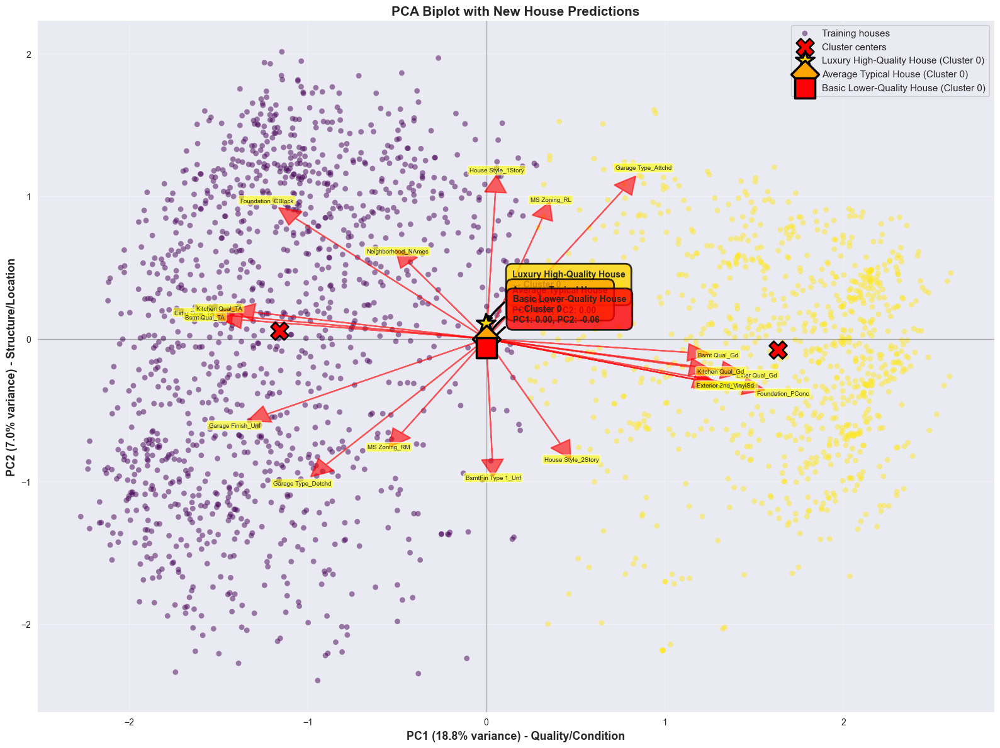

In [173]:
# Create the biplot WITH new houses
fig, ax = plt.subplots(figsize=(16, 12))
# Plot training data clusters
labels = kmeans_models[2]['labels']
scatter = ax.scatter(X_pca_98[:, 0], X_pca_98[:, 1], c=labels, cmap='viridis', 
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Plot cluster centers
centers = kmeans_model.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400, 
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Plot feature loading vectors
scale_factor = 3.5
top_pc1_idx = pc1_loadings.head(10).index
top_pc2_idx = pc2_loadings.head(10).index
top_features = list(set(list(top_pc1_idx) + list(top_pc2_idx)))

for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings[feature_idx, 0]*scale_factor, loadings[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings[feature_idx, 0]*scale_factor*1.15, loadings[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))
    
# Plot NEW HOUSES
markers = ['*', 'D', 's']  # Different symbols for each house
colors_new = ['gold', 'orange', 'red']

for idx, (house_name, house_data) in enumerate(synthetic_houses):
    house_df = pd.DataFrame([house_data])
    house_scaled = scaler.transform(house_df)
    house_pca = pca.transform(house_scaled)[0]
    cluster_pred = kmeans_model.predict(house_pca.reshape(1, -1))[0]
    
    # Plot the house
    ax.scatter(house_pca[0], house_pca[1], c=colors_new[idx], marker=markers[idx], 
              s=500, edgecolors='black', linewidth=2.5, zorder=10, label=f'{house_name} (Cluster {cluster_pred})')
    
    # Add annotation with arrow
    ax.annotate(f'{house_name}\n→ Cluster {cluster_pred}\nPC1: {house_pca[0]:.2f}, PC2: {house_pca[1]:.2f}', 
               xy=(house_pca[0], house_pca[1]), xytext=(30, 30),
               textcoords='offset points', fontsize=10, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.7', facecolor=colors_new[idx], alpha=0.8, edgecolor='black', linewidth=2),
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.3', lw=2.5, color='black'))

# Formatting
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance) - Quality/Condition', 
             fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance) - Structure/Location', 
             fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot with New House Predictions', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.95)

plt.tight_layout()
plt.show()

### All three houses have been added to the same cluster indicating that quality alone doesnt determine the cluster, but rather a combination of quality and structure/location features.

In [174]:
### We repeat the process for the 95% variance threshold

In [175]:
threshold = 0.95
X_pca_95 = pca_models[threshold].transform(df_scaled)

In [176]:
K_range_95, inertias_95, silhouette_scores_95 = find_optimal_k(X_pca_95, max_k=10)

In [177]:
for k, inertia, sil in zip(K_range_95, inertias_95, silhouette_scores_95):
    print(f"k={k}: Inertia={inertia:.2f}, Silhouette={sil:.4f}")

k=2: Inertia=19844.85, Silhouette=0.1623
k=3: Inertia=18700.95, Silhouette=0.1332
k=4: Inertia=18032.12, Silhouette=0.0959
k=5: Inertia=17560.98, Silhouette=0.0871
k=6: Inertia=17263.83, Silhouette=0.0765
k=7: Inertia=16914.94, Silhouette=0.0701
k=8: Inertia=16558.18, Silhouette=0.0638
k=9: Inertia=16312.45, Silhouette=0.0647
k=10: Inertia=16091.76, Silhouette=0.0613


### Similar to before, k=2 seems to provide the best-defined clusters based on silhouette scores, although the scores are still quite low overall. But worth it to mention that k=2 in this case is a little better than for 98% variance threshold.

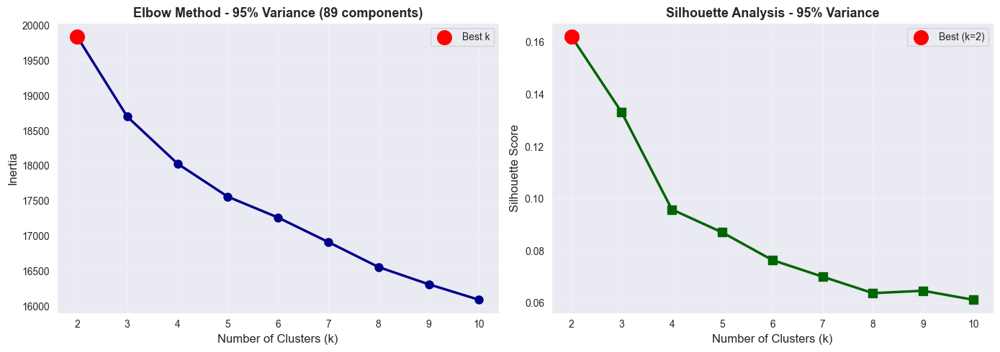


→ Best k for 95% variance: k=2 (silhouette=0.1576)


In [178]:
# Plot elbow method
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Inertia
ax = axes[0]
ax.plot(K_range_95, inertias_95, 'o-', linewidth=2.5, markersize=8, color='darkblue')
ax.scatter([2], [inertias_95[0]], color='red', s=200, zorder=5, label='Best k')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Inertia', fontsize=12)
ax.set_title('Elbow Method - 95% Variance (89 components)', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range_95)
ax.legend()

# Silhouette
ax = axes[1]
ax.plot(K_range_95, silhouette_scores_95, 's-', linewidth=2.5, markersize=8, color='darkgreen')
best_k_idx = np.argmax(silhouette_scores_95)
best_k = list(K_range_95)[best_k_idx]
ax.scatter([best_k], [silhouette_scores_95[best_k_idx]], color='red', s=200, zorder=5, label=f'Best (k={best_k})')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Silhouette Score', fontsize=12)
ax.set_title('Silhouette Analysis - 95% Variance', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range_95)
ax.legend()

plt.tight_layout()
plt.show()

print(f"\n→ Best k for 95% variance: k={best_k} (silhouette={silhouette_scores[best_k_idx]:.4f})")

In [179]:
# Train models for k=2,3,4,5
kmeans_models_95 = {}
for k in [2, 3, 4, 5]:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_95)
    kmeans_models_95[k] = {'model': kmeans, 'labels': labels}
    print(f"k={k}: Model trained ✓")

k=2: Model trained ✓
k=3: Model trained ✓
k=4: Model trained ✓
k=5: Model trained ✓


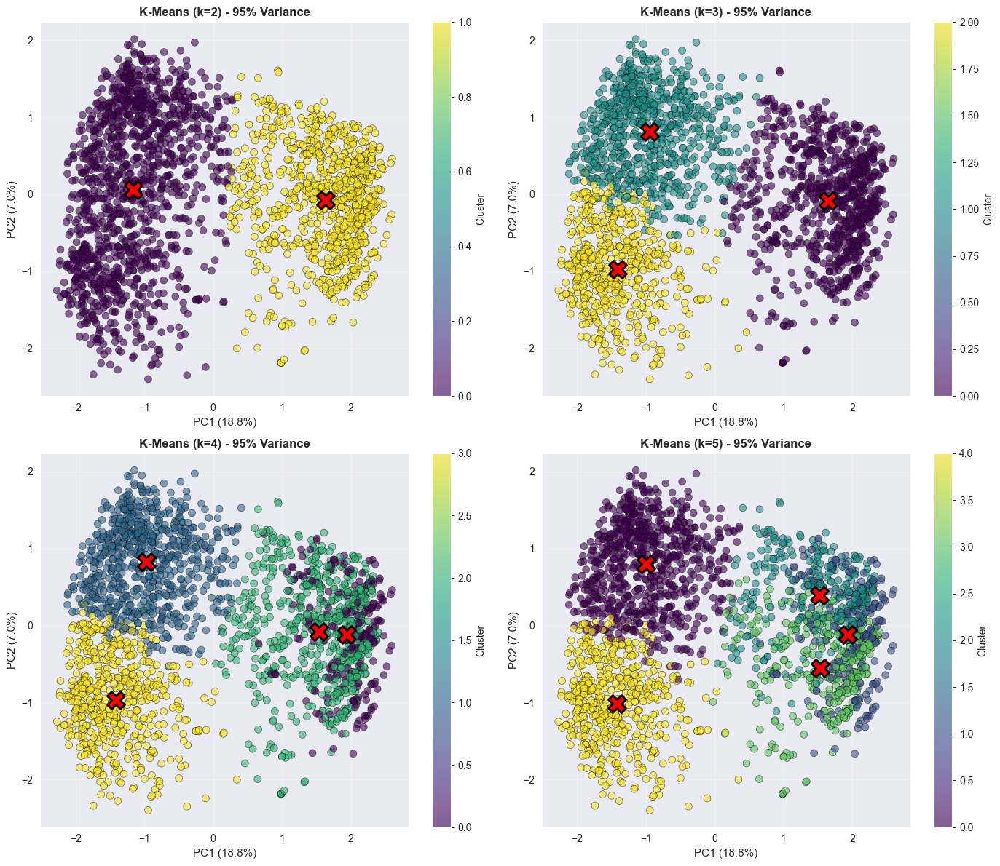

In [180]:
# Visualize 2D clusters
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, k in enumerate([2, 3, 4, 5]):
    ax = axes[idx]
    labels = kmeans_models_95[k]['labels']
    centers = kmeans_models_95[k]['model'].cluster_centers_
    
    scatter = ax.scatter(X_pca_95[:, 0], X_pca_95[:, 1], c=labels, cmap='viridis', 
                        s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
    ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=300, 
              edgecolors='black', linewidth=2, zorder=5)
    
    pca = pca_models[threshold]
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', fontsize=11)
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', fontsize=11)
    ax.set_title(f'K-Means (k={k}) - 95% Variance', fontsize=12, fontweight='bold')
    ax.grid(alpha=0.3)
    plt.colorbar(scatter, ax=ax, label='Cluster')

plt.tight_layout()
plt.show()

In [181]:
# Calculate loadings for 95%
pca_95 = pca_models[0.95]
loadings_95 = pca_95.components_.T * np.sqrt(pca_95.explained_variance_)

pc1_loadings_95 = pd.Series(loadings_95[:, 0], index=X.columns).abs().sort_values(ascending=False)
pc2_loadings_95 = pd.Series(loadings_95[:, 1], index=X.columns).abs().sort_values(ascending=False)

### PC1 and PC2 for 95% variance

In [182]:
print(pc1_loadings_95.head(15))

Foundation_PConc        0.412277
Exter Qual_TA           0.406225
Bsmt Qual_TA            0.391221
Exter Qual_Gd           0.376404
Kitchen Qual_TA         0.371553
Garage Finish_Unf       0.350375
Exterior 1st_VinylSd    0.336894
Exterior 2nd_VinylSd    0.332545
Kitchen Qual_Gd         0.326003
Bsmt Qual_Gd            0.322857
Foundation_CBlock       0.305234
Year Remod/Add          0.264394
Garage Type_Detchd      0.256328
BsmtFin Type 1_GLQ      0.254916
Heating QC_TA           0.228814
dtype: float64


In [183]:
### PC1 for 95% variance is similar to before, dominated by quality and condition features.

In [184]:
print(pc2_loadings_95.head(15))

Garage Type_Attchd      0.298149
House Style_1Story      0.293610
Garage Type_Detchd      0.252278
MS Zoning_RL            0.241949
BsmtFin Type 1_Unf      0.241863
Foundation_CBlock       0.241507
House Style_2Story      0.210243
MS Zoning_RM            0.188712
Neighborhood_NAmes      0.152432
Garage Finish_Unf       0.150755
Roof Style_Hip          0.141420
Roof Style_Gable        0.132747
Neighborhood_OldTown    0.124111
Garage Finish_RFn       0.117375
Bsmt Exposure_No        0.114220
dtype: float64


In [185]:
### PC2 for 95% variance is also similar, dominated by garage type and house stories.

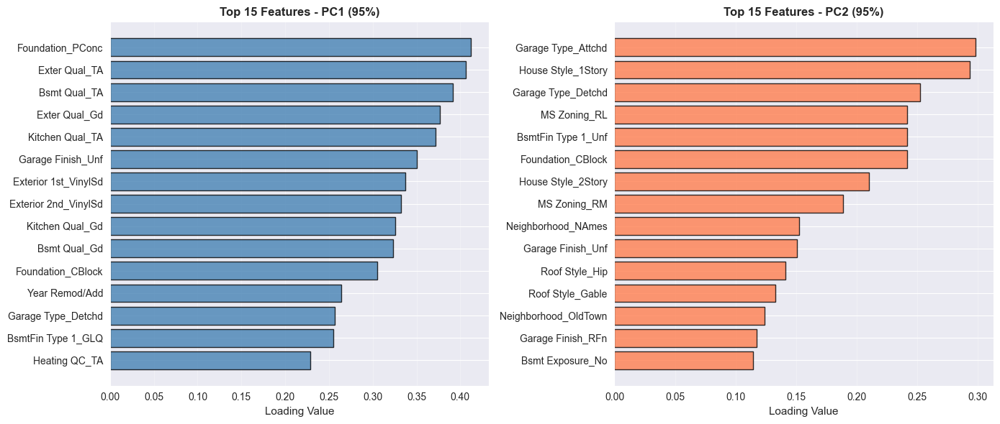

In [186]:
# Plot loadings
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

ax = axes[0]
top_pc1 = pc1_loadings_95.head(15).sort_values()
ax.barh(range(len(top_pc1)), top_pc1.values, color='steelblue', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc1)))
ax.set_yticklabels(top_pc1.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC1 (95%)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')

ax = axes[1]
top_pc2 = pc2_loadings_95.head(15).sort_values()
ax.barh(range(len(top_pc2)), top_pc2.values, color='coral', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc2)))
ax.set_yticklabels(top_pc2.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC2 (95%)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

# Create biplot for 95%

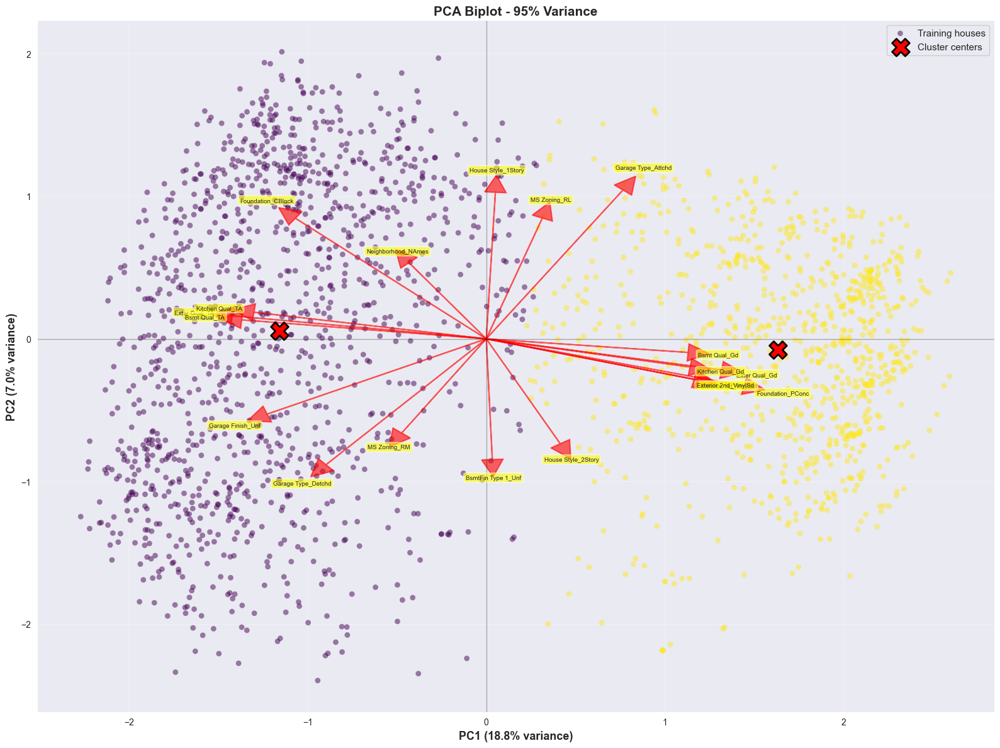

In [187]:
# Create biplot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot training data
k_final_95 = 2  # Use k=2 (or best k from silhouette)
labels = kmeans_models_95[k_final_95]['labels']
scatter = ax.scatter(X_pca_95[:, 0], X_pca_95[:, 1], c=labels, cmap='viridis', 
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Plot cluster centers
centers = kmeans_models_95[k_final_95]['model'].cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400, 
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Plot feature vectors
scale_factor = 3.5
top_pc1_idx = pc1_loadings_95.head(10).index
top_pc2_idx = pc2_loadings_95.head(10).index
top_features = list(set(list(top_pc1_idx) + list(top_pc2_idx)))

for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings_95[feature_idx, 0]*scale_factor, loadings_95[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings_95[feature_idx, 0]*scale_factor*1.15, loadings_95[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# Formatting
ax.set_xlabel(f'PC1 ({pca_95.explained_variance_ratio_[0]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_95.explained_variance_ratio_[1]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot - 95% Variance', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.95)

plt.tight_layout()
plt.show()

C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


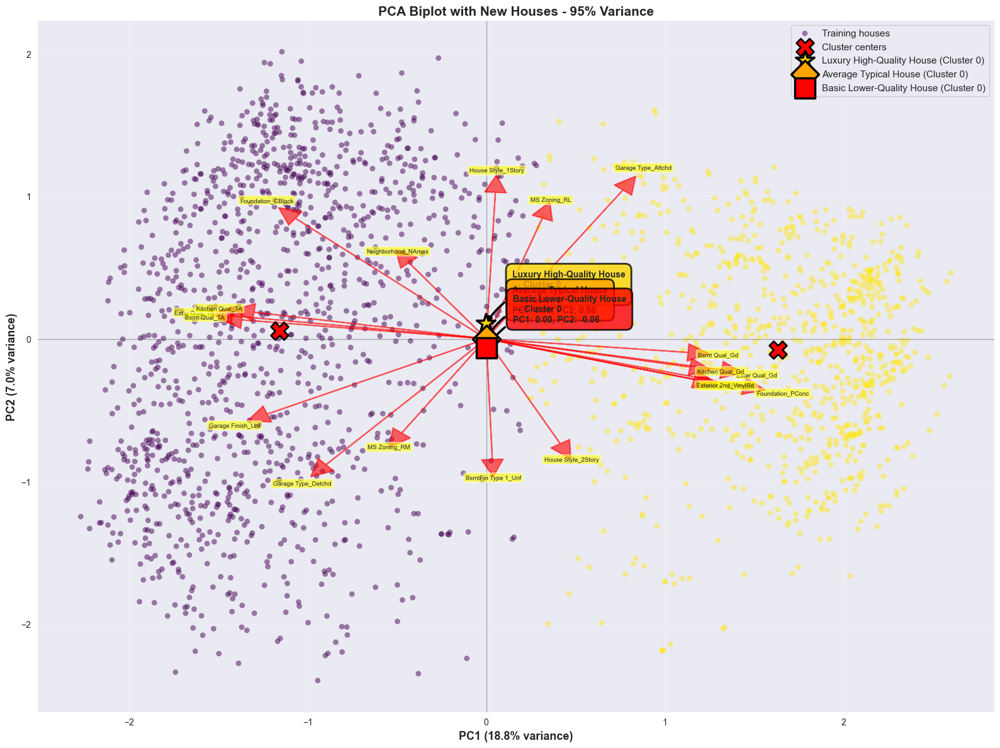


NEW HOUSE PREDICTIONS - 95% VARIANCE

1. Luxury High-Quality House
   Cluster: 0
   PC1: -0.0020
   PC2: +0.1083
   Distance to centroid: 1.5745

2. Average Typical House
   Cluster: 0
   PC1: +0.0000
   PC2: +0.0000
   Distance to centroid: 1.1631

3. Basic Lower-Quality House
   Cluster: 0
   PC1: +0.0012
   PC2: -0.0650
   Distance to centroid: 1.3360


C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [188]:
# Create synthetic houses
house_template = X.mean()

house1_features = house_template.copy()
quality_features = [col for col in X.columns if 'Qual' in col or 'Cond' in col]
for feat in quality_features:
    if feat in house1_features.index:
        house1_features[feat] = house1_features[feat] * 1.5

synthetic_houses_95 = [
    ('Luxury High-Quality House', house1_features),
    ('Average Typical House', house_template.copy()),
]

house3_features = house_template.copy()
for feat in quality_features:
    if feat in house3_features.index:
        house3_features[feat] = house3_features[feat] * 0.7
synthetic_houses_95.append(('Basic Lower-Quality House', house3_features))

# Get models
pca_95 = pca_models[0.95]
kmeans_model_95 = kmeans_models_95[k_final_95]['model']

# Create biplot with new houses
fig, ax = plt.subplots(figsize=(16, 12))

# Training data
labels = kmeans_models_95[k_final_95]['labels']
scatter = ax.scatter(X_pca_95[:, 0], X_pca_95[:, 1], c=labels, cmap='viridis', 
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Cluster centers
centers = kmeans_models_95[k_final_95]['model'].cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400, 
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Feature vectors
for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings_95[feature_idx, 0]*scale_factor, loadings_95[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings_95[feature_idx, 0]*scale_factor*1.15, loadings_95[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# NEW HOUSES
markers = ['*', 'D', 's']
colors_new = ['gold', 'orange', 'red']

for idx, (house_name, house_data) in enumerate(synthetic_houses_95):
    house_df = pd.DataFrame([house_data])
    house_df.columns = X.columns
    
    house_scaled = scaler.transform(house_df)
    house_pca = pca_95.transform(house_scaled)[0]
    cluster_pred = kmeans_model_95.predict(house_pca.reshape(1, -1))[0]
    
    ax.scatter(house_pca[0], house_pca[1], c=colors_new[idx], marker=markers[idx], 
              s=500, edgecolors='black', linewidth=2.5, zorder=10, 
              label=f'{house_name} (Cluster {cluster_pred})')
    
    ax.annotate(f'{house_name}\n→ Cluster {cluster_pred}\nPC1: {house_pca[0]:.2f}, PC2: {house_pca[1]:.2f}', 
               xy=(house_pca[0], house_pca[1]), xytext=(30, 30),
               textcoords='offset points', fontsize=10, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.7', facecolor=colors_new[idx], alpha=0.8, edgecolor='black', linewidth=2),
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.3', lw=2.5, color='black'))

# Formatting
ax.set_xlabel(f'PC1 ({pca_95.explained_variance_ratio_[0]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_95.explained_variance_ratio_[1]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot with New Houses - 95% Variance', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.95)

plt.tight_layout()
plt.show()

# Print results
print("\n" + "="*80)
print("NEW HOUSE PREDICTIONS - 95% VARIANCE")
print("="*80)

for idx, (house_name, house_data) in enumerate(synthetic_houses_95):
    house_df = pd.DataFrame([house_data])
    house_df.columns = X.columns
    
    house_scaled = scaler.transform(house_df)
    house_pca = pca_95.transform(house_scaled)[0]
    cluster_pred = kmeans_model_95.predict(house_pca.reshape(1, -1))[0]
    distance = np.linalg.norm(house_pca - kmeans_model_95.cluster_centers_[cluster_pred])
    
    print(f"\n{idx+1}. {house_name}")
    print(f"   Cluster: {cluster_pred}")
    print(f"   PC1: {house_pca[0]:+.4f}")
    print(f"   PC2: {house_pca[1]:+.4f}")
    print(f"   Distance to centroid: {distance:.4f}")

In [189]:
### Similar to before, all three synthetic houses fall into the same cluster, indicating that the clustering is influenced by a combination of features rather than just quality alone.

In [190]:
threshold = 0.90
X_pca_90 = pca_models[threshold].transform(df_scaled)

In [191]:
K_range_90, inertias_90, silhouette_scores_90 = find_optimal_k(X_pca_90, max_k=10)

In [192]:
for k, inertia, sil in zip(K_range_90, inertias_90, silhouette_scores_90):
    print(f"k={k}: Inertia={inertia:.2f}, Silhouette={sil:.4f}")

k=2: Inertia=18596.28, Silhouette=0.1710
k=3: Inertia=17453.07, Silhouette=0.1380
k=4: Inertia=16788.58, Silhouette=0.1028
k=5: Inertia=16317.98, Silhouette=0.0929
k=6: Inertia=15996.12, Silhouette=0.0923
k=7: Inertia=15576.31, Silhouette=0.0768
k=8: Inertia=15416.41, Silhouette=0.0756
k=9: Inertia=15100.94, Silhouette=0.0766
k=10: Inertia=14869.36, Silhouette=0.0727


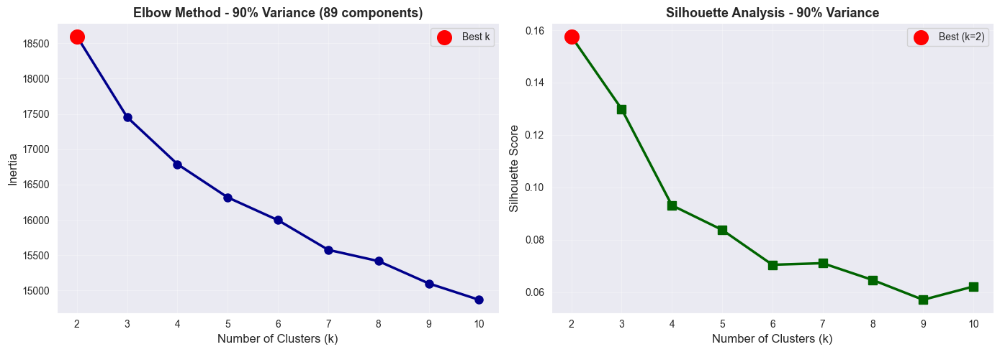

In [193]:
# Plot elbow method
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Inertia
ax = axes[0]
ax.plot(K_range_90, inertias_90, 'o-', linewidth=2.5, markersize=8, color='darkblue')
ax.scatter([2], [inertias_90[0]], color='red', s=200, zorder=5, label='Best k')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Inertia', fontsize=12)
ax.set_title('Elbow Method - 90% Variance (89 components)', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range_90)
ax.legend()

# Silhouette
ax = axes[1]
ax.plot(K_range_90, silhouette_scores, 's-', linewidth=2.5, markersize=8, color='darkgreen')
best_k_idx = np.argmax(silhouette_scores)
best_k = list(K_range_90)[best_k_idx]
ax.scatter([best_k], [silhouette_scores[best_k_idx]], color='red', s=200, zorder=5, label=f'Best (k={best_k})')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Silhouette Score', fontsize=12)
ax.set_title('Silhouette Analysis - 90% Variance', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range_90)
ax.legend()

plt.tight_layout()
plt.show()

In [194]:
print(f"\n→ Best k for 90% variance: k={best_k} (silhouette={silhouette_scores[best_k_idx]:.4f})")


→ Best k for 90% variance: k=2 (silhouette=0.1576)


In [195]:
# Train models for k=2,3,4,5
kmeans_models_90 = {}
for k in [2, 3, 4, 5]:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_90)
    kmeans_models_90[k] = {'model': kmeans, 'labels': labels}
    print(f"k={k}: Model trained ✓")

k=2: Model trained ✓
k=3: Model trained ✓
k=4: Model trained ✓
k=5: Model trained ✓


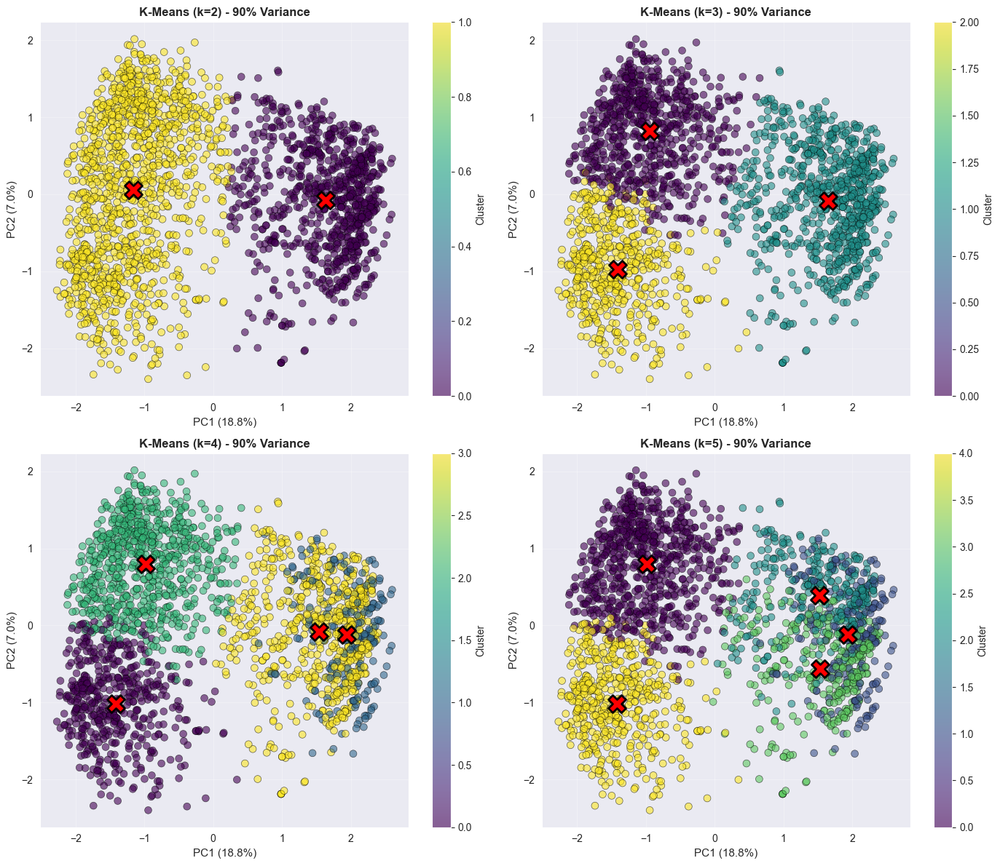

In [196]:
# Visualize 2D clusters
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, k in enumerate([2, 3, 4, 5]):
    ax = axes[idx]
    labels = kmeans_models_90[k]['labels']
    centers = kmeans_models_90[k]['model'].cluster_centers_

    scatter = ax.scatter(X_pca_90[:, 0], X_pca_90[:, 1], c=labels, cmap='viridis',
                        s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
    ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=300,
              edgecolors='black', linewidth=2, zorder=5)

    pca = pca_models[threshold]
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', fontsize=11)
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', fontsize=11)
    ax.set_title(f'K-Means (k={k}) - 90% Variance', fontsize=12, fontweight='bold')
    ax.grid(alpha=0.3)
    plt.colorbar(scatter, ax=ax, label='Cluster')

plt.tight_layout()
plt.show()

In [197]:
# Calculate loadings for 90%
pca_90 = pca_models[0.90]
loadings_90 = pca_90.components_.T * np.sqrt(pca_90.explained_variance_)

pc1_loadings_90 = pd.Series(loadings_90[:, 0], index=X.columns).abs().sort_values(ascending=False)
pc2_loadings_90 = pd.Series(loadings_90[:, 1], index=X.columns).abs().sort_values(ascending=False)

In [198]:
print(pc1_loadings_90.head(15))

Foundation_PConc        0.412277
Exter Qual_TA           0.406225
Bsmt Qual_TA            0.391221
Exter Qual_Gd           0.376404
Kitchen Qual_TA         0.371553
Garage Finish_Unf       0.350375
Exterior 1st_VinylSd    0.336894
Exterior 2nd_VinylSd    0.332545
Kitchen Qual_Gd         0.326003
Bsmt Qual_Gd            0.322857
Foundation_CBlock       0.305234
Year Remod/Add          0.264394
Garage Type_Detchd      0.256328
BsmtFin Type 1_GLQ      0.254916
Heating QC_TA           0.228814
dtype: float64


In [199]:
print(pc2_loadings_90.head(15))

Garage Type_Attchd      0.298149
House Style_1Story      0.293610
Garage Type_Detchd      0.252278
MS Zoning_RL            0.241949
BsmtFin Type 1_Unf      0.241863
Foundation_CBlock       0.241507
House Style_2Story      0.210243
MS Zoning_RM            0.188712
Neighborhood_NAmes      0.152432
Garage Finish_Unf       0.150755
Roof Style_Hip          0.141420
Roof Style_Gable        0.132747
Neighborhood_OldTown    0.124111
Garage Finish_RFn       0.117375
Bsmt Exposure_No        0.114220
dtype: float64


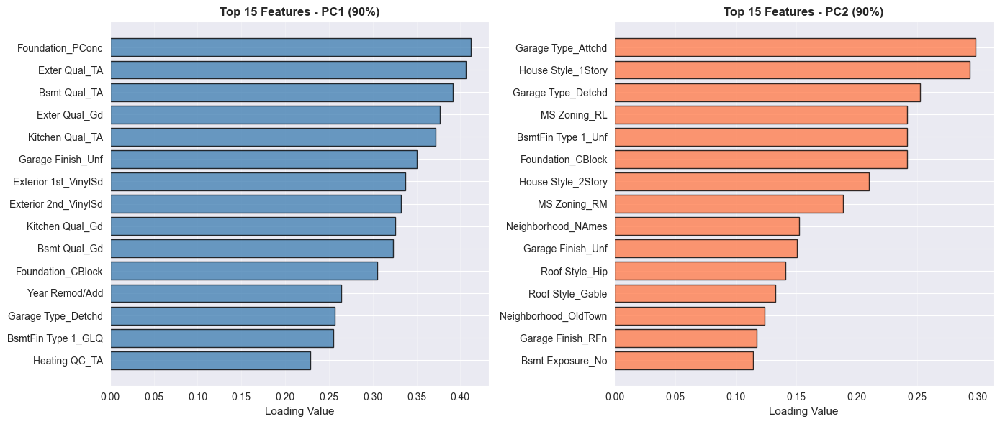

In [200]:
# Plot loadings
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

ax = axes[0]
top_pc1 = pc1_loadings_90.head(15).sort_values()
ax.barh(range(len(top_pc1)), top_pc1.values, color='steelblue', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc1)))
ax.set_yticklabels(top_pc1.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC1 (90%)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')

ax = axes[1]
top_pc2 = pc2_loadings_90.head(15).sort_values()
ax.barh(range(len(top_pc2)), top_pc2.values, color='coral', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc2)))
ax.set_yticklabels(top_pc2.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC2 (90%)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

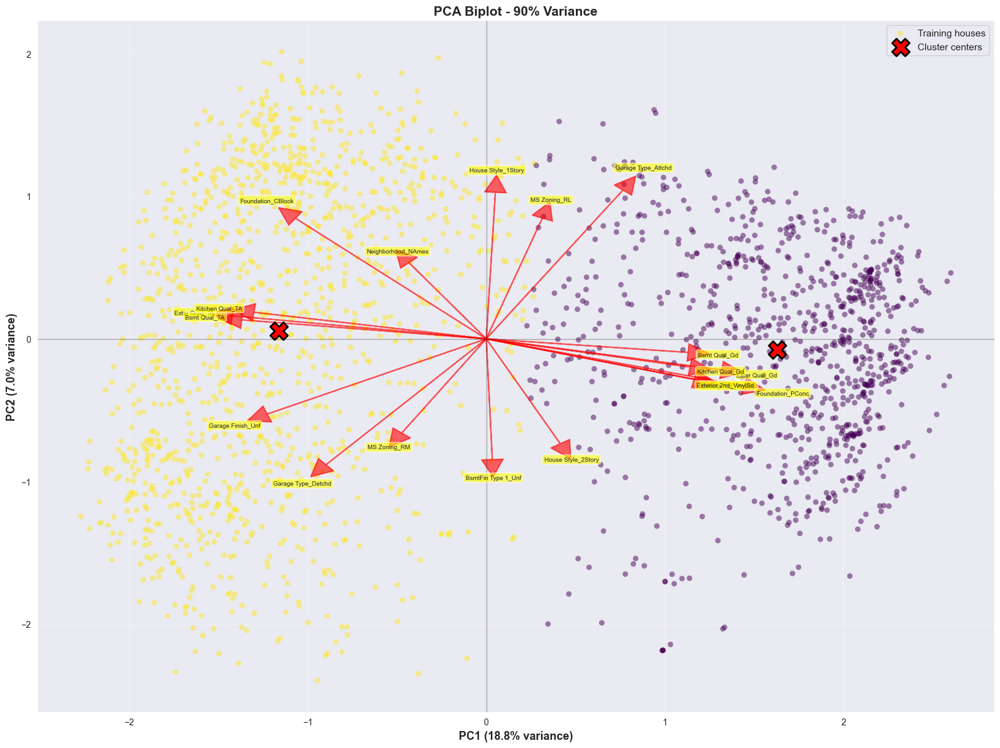

In [201]:
# Create biplot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot training data
k_final_90 = 2  # Use k=2 (or best k from silhouette)
labels = kmeans_models_90[k_final_90]['labels']
scatter = ax.scatter(X_pca_90[:, 0], X_pca_90[:, 1], c=labels, cmap='viridis',
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Plot cluster centers
centers = kmeans_models_90[k_final_90]['model'].cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400,
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Plot feature vectors
scale_factor = 3.5
top_pc1_idx = pc1_loadings_90.head(10).index
top_pc2_idx = pc2_loadings_90.head(10).index
top_features = list(set(list(top_pc1_idx) + list(top_pc2_idx)))

for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings_90[feature_idx, 0]*scale_factor, loadings_90[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings_90[feature_idx, 0]*scale_factor*1.15, loadings_90[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# Formatting
ax.set_xlabel(f'PC1 ({pca_90.explained_variance_ratio_[0]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_90.explained_variance_ratio_[1]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot - 90% Variance', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.90)

plt.tight_layout()
plt.show()

C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


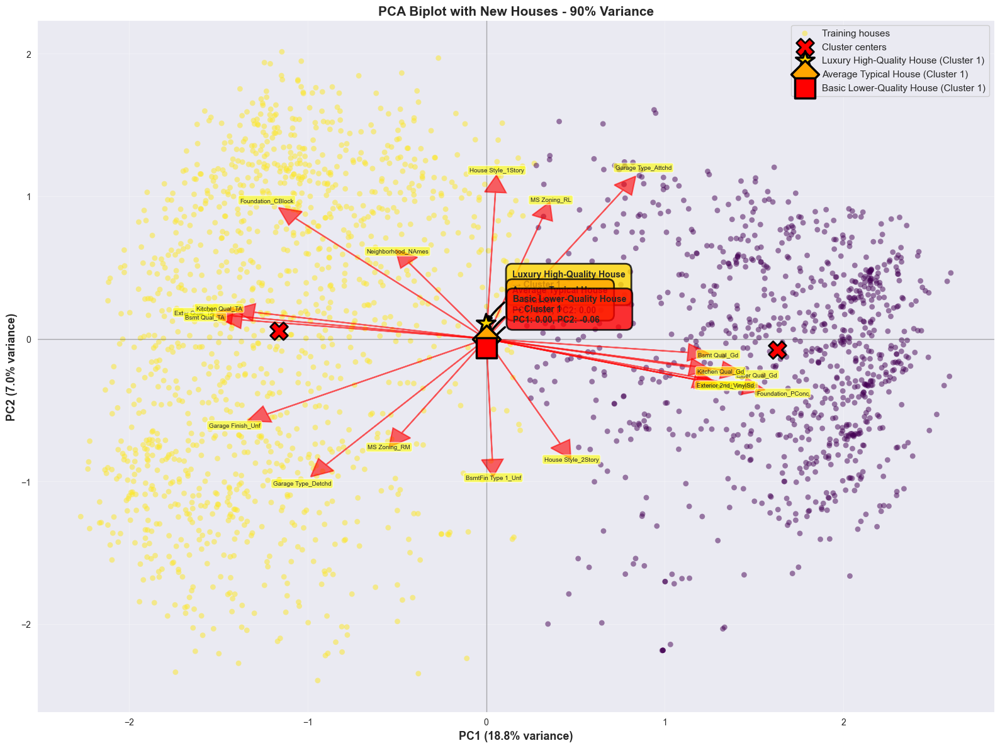


NEW HOUSE PREDICTIONS - 90% VARIANCE

1. Luxury High-Quality House
   Cluster: 1
   PC1: -0.0020
   PC2: +0.1083
   Distance to centroid: 1.5421

2. Average Typical House
   Cluster: 1
   PC1: +0.0000
   PC2: +0.0000
   Distance to centroid: 1.1642

3. Basic Lower-Quality House
   Cluster: 1
   PC1: +0.0012
   PC2: -0.0650
   Distance to centroid: 1.3226


C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [202]:
# Create synthetic houses
house_template = X.mean()

house1_features = house_template.copy()
quality_features = [col for col in X.columns if 'Qual' in col or 'Cond' in col]
for feat in quality_features:
    if feat in house1_features.index:
        house1_features[feat] = house1_features[feat] * 1.5

synthetic_houses_90 = [
    ('Luxury High-Quality House', house1_features),
    ('Average Typical House', house_template.copy()),
]

house3_features = house_template.copy()
for feat in quality_features:
    if feat in house3_features.index:
        house3_features[feat] = house3_features[feat] * 0.7
synthetic_houses_90.append(('Basic Lower-Quality House', house3_features))

# Get models
pca_90 = pca_models[0.90]
kmeans_model_90 = kmeans_models_90[k_final_90]['model']

# Create biplot with new houses
fig, ax = plt.subplots(figsize=(16, 12))

# Training data
labels = kmeans_models_90[k_final_90]['labels']
scatter = ax.scatter(X_pca_90[:, 0], X_pca_90[:, 1], c=labels, cmap='viridis',
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Cluster centers
centers = kmeans_models_90[k_final_90]['model'].cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400,
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Feature vectors
for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings_90[feature_idx, 0]*scale_factor, loadings_90[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings_90[feature_idx, 0]*scale_factor*1.15, loadings_90[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# NEW HOUSES
markers = ['*', 'D', 's']
colors_new = ['gold', 'orange', 'red']

for idx, (house_name, house_data) in enumerate(synthetic_houses_90):
    house_df = pd.DataFrame([house_data])
    house_df.columns = X.columns

    house_scaled = scaler.transform(house_df)
    house_pca = pca_90.transform(house_scaled)[0]
    cluster_pred = kmeans_model_90.predict(house_pca.reshape(1, -1))[0]

    ax.scatter(house_pca[0], house_pca[1], c=colors_new[idx], marker=markers[idx],
              s=500, edgecolors='black', linewidth=2.5, zorder=10,
              label=f'{house_name} (Cluster {cluster_pred})')

    ax.annotate(f'{house_name}\n→ Cluster {cluster_pred}\nPC1: {house_pca[0]:.2f}, PC2: {house_pca[1]:.2f}',
               xy=(house_pca[0], house_pca[1]), xytext=(30, 30),
               textcoords='offset points', fontsize=10, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.7', facecolor=colors_new[idx], alpha=0.8, edgecolor='black', linewidth=2),
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.3', lw=2.5, color='black'))

# Formatting
ax.set_xlabel(f'PC1 ({pca_90.explained_variance_ratio_[0]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_90.explained_variance_ratio_[1]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot with New Houses - 90% Variance', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.95)

plt.tight_layout()
plt.show()

# Print results
print("\n" + "="*80)
print("NEW HOUSE PREDICTIONS - 90% VARIANCE")
print("="*80)

for idx, (house_name, house_data) in enumerate(synthetic_houses_90):
    house_df = pd.DataFrame([house_data])
    house_df.columns = X.columns

    house_scaled = scaler.transform(house_df)
    house_pca = pca_90.transform(house_scaled)[0]
    cluster_pred = kmeans_model_90.predict(house_pca.reshape(1, -1))[0]
    distance = np.linalg.norm(house_pca - kmeans_model_90.cluster_centers_[cluster_pred])

    print(f"\n{idx+1}. {house_name}")
    print(f"   Cluster: {cluster_pred}")
    print(f"   PC1: {house_pca[0]:+.4f}")
    print(f"   PC2: {house_pca[1]:+.4f}")
    print(f"   Distance to centroid: {distance:.4f}")

In [203]:
threshold = 0.80
X_pca_80 = pca_models[threshold].transform(df_scaled)

In [204]:
K_range_80, inertias_80, silhouette_scores_80 = find_optimal_k(X_pca_80, max_k=10)

In [205]:
for k, inertia, sil in zip(K_range_80, inertias_80, silhouette_scores_80):
    print(f"k={k}: Inertia={inertia:.2f}, Silhouette={sil:.4f}")


k=2: Inertia=16133.48, Silhouette=0.1915
k=3: Inertia=14992.16, Silhouette=0.1508
k=4: Inertia=14334.66, Silhouette=0.1169
k=5: Inertia=13899.83, Silhouette=0.1115
k=6: Inertia=13459.62, Silhouette=0.1003
k=7: Inertia=13134.25, Silhouette=0.0883
k=8: Inertia=12930.61, Silhouette=0.0913
k=9: Inertia=12639.97, Silhouette=0.0825
k=10: Inertia=12410.34, Silhouette=0.0849


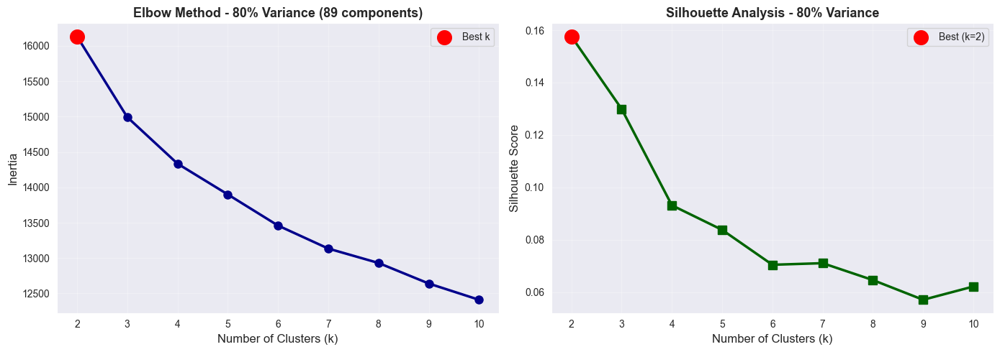

In [206]:
# Plot elbow method
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Inertia
ax = axes[0]
ax.plot(K_range_80, inertias_80, 'o-', linewidth=2.5, markersize=8, color='darkblue')
ax.scatter([2], [inertias_80[0]], color='red', s=200, zorder=5, label='Best k')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Inertia', fontsize=12)
ax.set_title('Elbow Method - 80% Variance (89 components)', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range_80)
ax.legend()

# Silhouette
ax = axes[1]
ax.plot(K_range_80, silhouette_scores, 's-', linewidth=2.5, markersize=8, color='darkgreen')
best_k_idx = np.argmax(silhouette_scores)
best_k = list(K_range_80)[best_k_idx]
ax.scatter([best_k], [silhouette_scores[best_k_idx]], color='red', s=200, zorder=5, label=f'Best (k={best_k})')
ax.set_xlabel('Number of Clusters (k)', fontsize=12)
ax.set_ylabel('Silhouette Score', fontsize=12)
ax.set_title('Silhouette Analysis - 80% Variance', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.set_xticks(K_range_80)
ax.legend()

plt.tight_layout()
plt.show()


In [207]:

print(f"\n→ Best k for 80% variance: k={best_k} (silhouette={silhouette_scores[best_k_idx]:.4f})")


→ Best k for 80% variance: k=2 (silhouette=0.1576)


In [208]:
# Train models for k=2,3,4,5
kmeans_models_80 = {}
for k in [2, 3, 4, 5]:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_80)
    kmeans_models_80[k] = {'model': kmeans, 'labels': labels}
    print(f"k={k}: Model trained ✓")


k=2: Model trained ✓
k=3: Model trained ✓
k=4: Model trained ✓
k=5: Model trained ✓


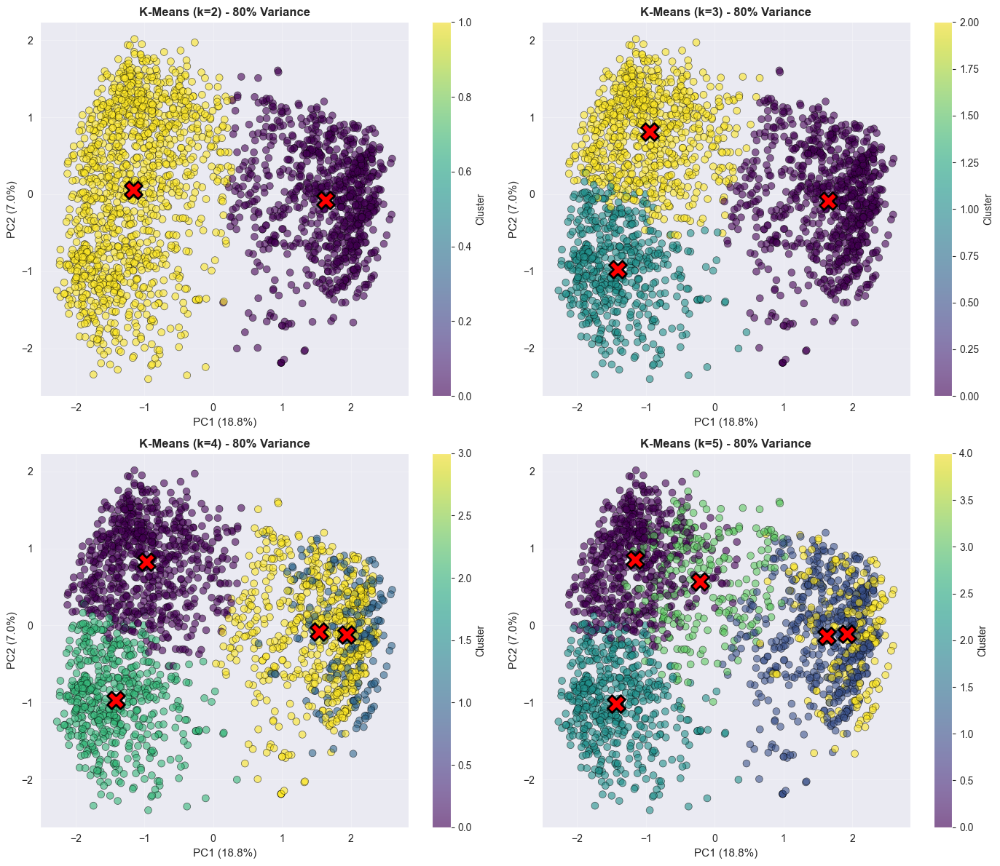

In [209]:
# Visualize 2D clusters
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, k in enumerate([2, 3, 4, 5]):
    ax = axes[idx]
    labels = kmeans_models_80[k]['labels']
    centers = kmeans_models_80[k]['model'].cluster_centers_

    scatter = ax.scatter(X_pca_80[:, 0], X_pca_80[:, 1], c=labels, cmap='viridis',
                        s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
    ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=300,
              edgecolors='black', linewidth=2, zorder=5)

    pca = pca_models[threshold]
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', fontsize=11)
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', fontsize=11)
    ax.set_title(f'K-Means (k={k}) - 80% Variance', fontsize=12, fontweight='bold')
    ax.grid(alpha=0.3)
    plt.colorbar(scatter, ax=ax, label='Cluster')

plt.tight_layout()
plt.show()

In [210]:
# Calculate loadings for 80%
pca_80 = pca_models[0.80]
loadings_80 = pca_80.components_.T * np.sqrt(pca_80.explained_variance_)

pc1_loadings_80 = pd.Series(loadings_80[:, 0], index=X.columns).abs().sort_values(ascending=False)
pc2_loadings_80 = pd.Series(loadings_80[:, 1], index=X.columns).abs().sort_values(ascending=False)

In [211]:
print(pc1_loadings_80.head(15))

Foundation_PConc        0.412277
Exter Qual_TA           0.406225
Bsmt Qual_TA            0.391221
Exter Qual_Gd           0.376404
Kitchen Qual_TA         0.371553
Garage Finish_Unf       0.350375
Exterior 1st_VinylSd    0.336894
Exterior 2nd_VinylSd    0.332545
Kitchen Qual_Gd         0.326003
Bsmt Qual_Gd            0.322857
Foundation_CBlock       0.305234
Year Remod/Add          0.264394
Garage Type_Detchd      0.256328
BsmtFin Type 1_GLQ      0.254916
Heating QC_TA           0.228814
dtype: float64


In [212]:
print(pc2_loadings_80.head(15))

Garage Type_Attchd      0.298149
House Style_1Story      0.293610
Garage Type_Detchd      0.252278
MS Zoning_RL            0.241949
BsmtFin Type 1_Unf      0.241863
Foundation_CBlock       0.241507
House Style_2Story      0.210243
MS Zoning_RM            0.188712
Neighborhood_NAmes      0.152432
Garage Finish_Unf       0.150755
Roof Style_Hip          0.141420
Roof Style_Gable        0.132747
Neighborhood_OldTown    0.124111
Garage Finish_RFn       0.117375
Bsmt Exposure_No        0.114220
dtype: float64


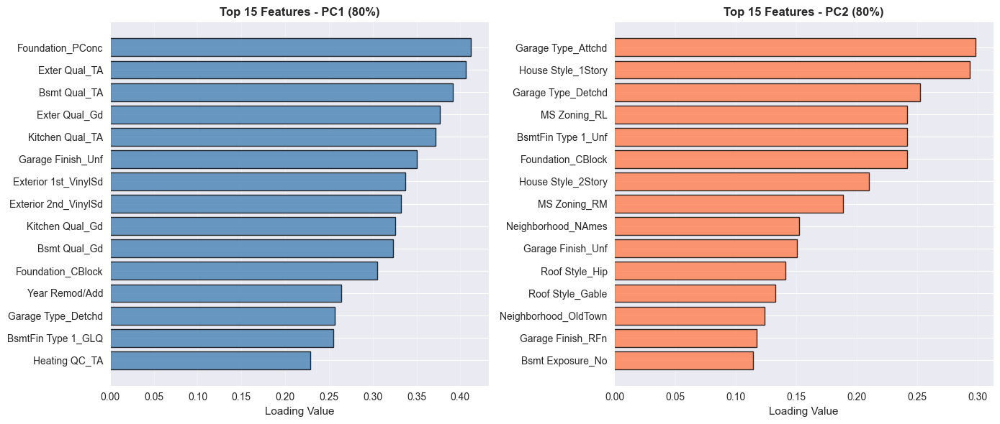

In [213]:
# Plot loadings
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

ax = axes[0]
top_pc1 = pc1_loadings_80.head(15).sort_values()
ax.barh(range(len(top_pc1)), top_pc1.values, color='steelblue', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc1)))
ax.set_yticklabels(top_pc1.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC1 (80%)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')

ax = axes[1]
top_pc2 = pc2_loadings_80.head(15).sort_values()
ax.barh(range(len(top_pc2)), top_pc2.values, color='coral', alpha=0.8, edgecolor='black')
ax.set_yticks(range(len(top_pc2)))
ax.set_yticklabels(top_pc2.index, fontsize=10)
ax.set_xlabel('Loading Value', fontsize=11)
ax.set_title('Top 15 Features - PC2 (80%)', fontsize=12, fontweight='bold')
ax.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.show()


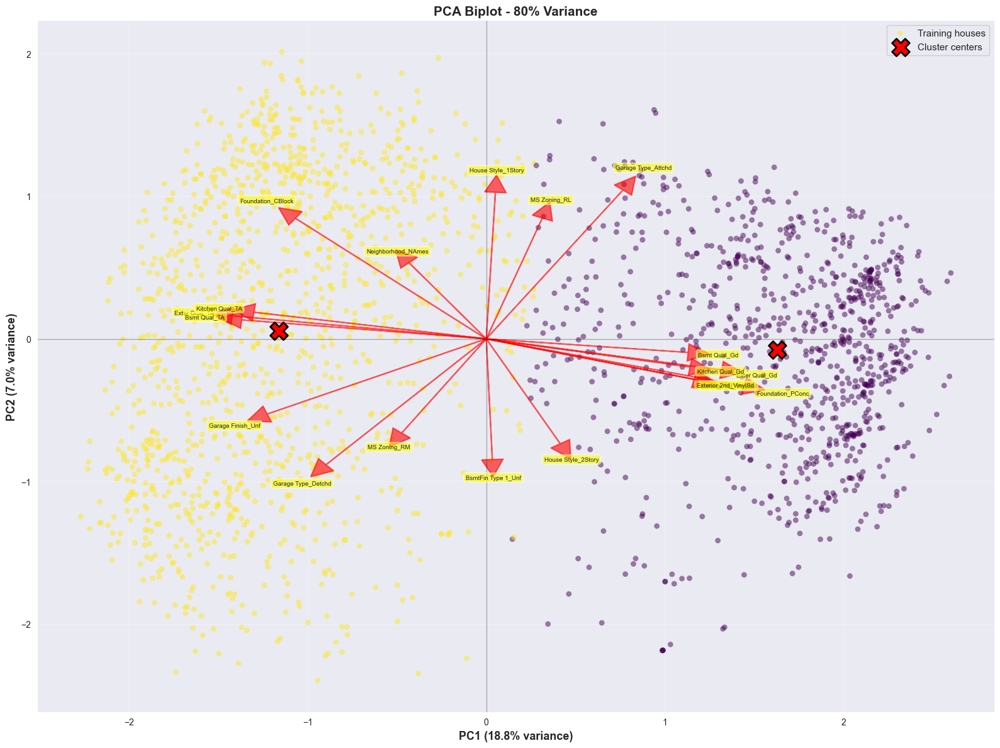

In [214]:
# Create biplot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot training data
k_final_80 = 2  # Use k=2 (or best k from silhouette)
labels = kmeans_models_80[k_final_80]['labels']
scatter = ax.scatter(X_pca_80[:, 0], X_pca_80[:, 1], c=labels, cmap='viridis',
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Plot cluster centers
centers = kmeans_models_80[k_final_80]['model'].cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400,
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Plot feature vectors
scale_factor = 3.5
top_pc1_idx = pc1_loadings_80.head(10).index
top_pc2_idx = pc2_loadings_80.head(10).index
top_features = list(set(list(top_pc1_idx) + list(top_pc2_idx)))

for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings_80[feature_idx, 0]*scale_factor, loadings_80[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings_80[feature_idx, 0]*scale_factor*1.15, loadings_80[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# Formatting
ax.set_xlabel(f'PC1 ({pca_80.explained_variance_ratio_[0]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_80.explained_variance_ratio_[1]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot - 80% Variance', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.95)

plt.tight_layout()
plt.show()

C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


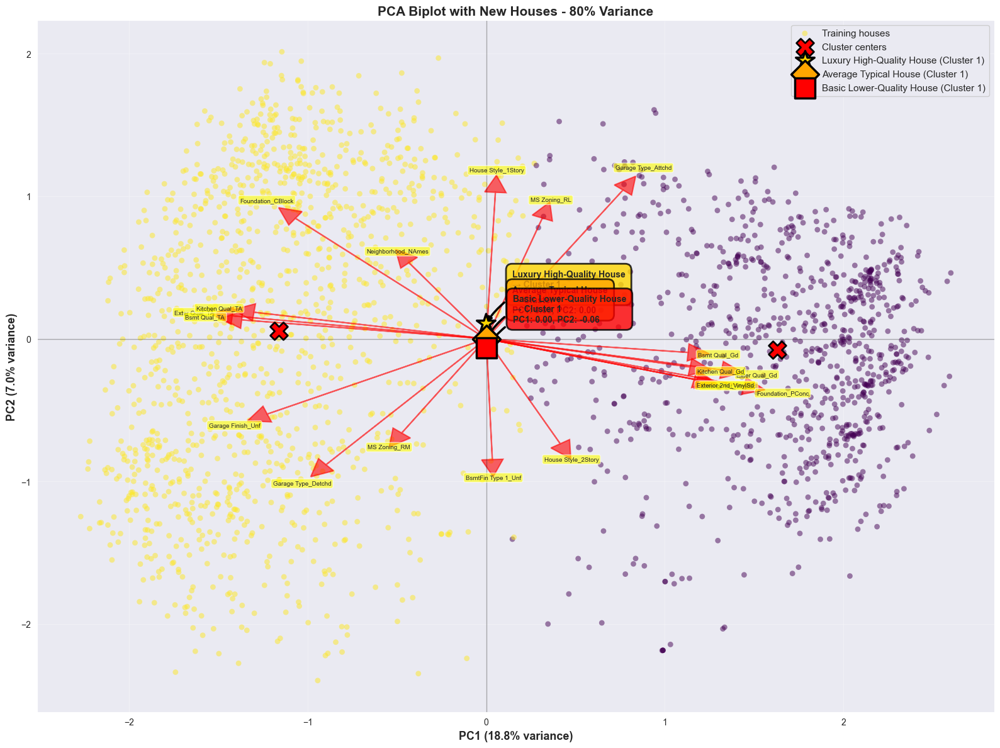


NEW HOUSE PREDICTIONS - 80% VARIANCE

1. Luxury High-Quality House
   Cluster: 1
   PC1: -0.0020
   PC2: +0.1083
   Distance to centroid: 1.4244

2. Average Typical House
   Cluster: 1
   PC1: +0.0000
   PC2: +0.0000
   Distance to centroid: 1.1640

3. Basic Lower-Quality House
   Cluster: 1
   PC1: +0.0012
   PC2: -0.0650
   Distance to centroid: 1.2702


C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
C:\Users\vasiu\UBB\Info\ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [215]:
# Create synthetic houses
house_template = X.mean()

house1_features = house_template.copy()
quality_features = [col for col in X.columns if 'Qual' in col or 'Cond' in col]
for feat in quality_features:
    if feat in house1_features.index:
        house1_features[feat] = house1_features[feat] * 1.5

synthetic_houses_80 = [
    ('Luxury High-Quality House', house1_features),
    ('Average Typical House', house_template.copy()),
]

house3_features = house_template.copy()
for feat in quality_features:
    if feat in house3_features.index:
        house3_features[feat] = house3_features[feat] * 0.7
synthetic_houses_80.append(('Basic Lower-Quality House', house3_features))

# Get models
pca_80 = pca_models[0.80]
kmeans_model_80 = kmeans_models_80[k_final_80]['model']

# Create biplot with new houses
fig, ax = plt.subplots(figsize=(16, 12))

# Training data
labels = kmeans_models_80[k_final_80]['labels']
scatter = ax.scatter(X_pca_80[:, 0], X_pca_80[:, 1], c=labels, cmap='viridis',
                     s=40, alpha=0.5, edgecolors='none', label='Training houses')

# Cluster centers
centers = kmeans_models_80[k_final_80]['model'].cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=400,
          edgecolors='black', linewidth=2, label='Cluster centers', zorder=5)

# Feature vectors
for feature_name in top_features:
    feature_idx = X.columns.get_loc(feature_name)
    ax.arrow(0, 0, loadings_80[feature_idx, 0]*scale_factor, loadings_80[feature_idx, 1]*scale_factor,
            head_width=0.12, head_length=0.12, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    ax.text(loadings_80[feature_idx, 0]*scale_factor*1.15, loadings_80[feature_idx, 1]*scale_factor*1.15,
           feature_name, fontsize=7, ha='center', va='center',
           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.6))

# NEW HOUSES
markers = ['*', 'D', 's']
colors_new = ['gold', 'orange', 'red']

for idx, (house_name, house_data) in enumerate(synthetic_houses_80):
    house_df = pd.DataFrame([house_data])
    house_df.columns = X.columns

    house_scaled = scaler.transform(house_df)
    house_pca = pca_80.transform(house_scaled)[0]
    cluster_pred = kmeans_model_80.predict(house_pca.reshape(1, -1))[0]

    ax.scatter(house_pca[0], house_pca[1], c=colors_new[idx], marker=markers[idx],
              s=500, edgecolors='black', linewidth=2.5, zorder=10,
              label=f'{house_name} (Cluster {cluster_pred})')

    ax.annotate(f'{house_name}\n→ Cluster {cluster_pred}\nPC1: {house_pca[0]:.2f}, PC2: {house_pca[1]:.2f}',
               xy=(house_pca[0], house_pca[1]), xytext=(30, 30),
               textcoords='offset points', fontsize=10, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.7', facecolor=colors_new[idx], alpha=0.8, edgecolor='black', linewidth=2),
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.3', lw=2.5, color='black'))

# Formatting
ax.set_xlabel(f'PC1 ({pca_80.explained_variance_ratio_[0]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_80.explained_variance_ratio_[1]:.1%} variance)', fontsize=13, fontweight='bold')
ax.set_title('PCA Biplot with New Houses - 80% Variance', fontsize=15, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(y=0, color='k', linewidth=1, alpha=0.3)
ax.axvline(x=0, color='k', linewidth=1, alpha=0.3)
ax.legend(fontsize=11, loc='best', framealpha=0.95)

plt.tight_layout()
plt.show()

# Print results
print("\n" + "="*80)
print("NEW HOUSE PREDICTIONS - 80% VARIANCE")
print("="*80)

for idx, (house_name, house_data) in enumerate(synthetic_houses_80):
    house_df = pd.DataFrame([house_data])
    house_df.columns = X.columns

    house_scaled = scaler.transform(house_df)
    house_pca = pca_80.transform(house_scaled)[0]
    cluster_pred = kmeans_model_80.predict(house_pca.reshape(1, -1))[0]
    distance = np.linalg.norm(house_pca - kmeans_model_80.cluster_centers_[cluster_pred])

    print(f"\n{idx+1}. {house_name}")
    print(f"   Cluster: {cluster_pred}")
    print(f"   PC1: {house_pca[0]:+.4f}")
    print(f"   PC2: {house_pca[1]:+.4f}")
    print(f"   Distance to centroid: {distance:.4f}")

# BONUS A

In [216]:
from sklearn.preprocessing import StandardScaler
import numpy as np


In [217]:
df_minmax = df_scaled.copy()

# Creating Z-score normalization
scaler_std = StandardScaler()
df_std = scaler_std.fit_transform(X)
df_std = pd.DataFrame(df_std, columns=X.columns)

In [218]:
#apllying log transformation to numerical columns
df_for_log = X.copy()
numerical_cols = X.select_dtypes(include=[np.number]).columns

In [219]:
# Log transform: log(1 + x) to avoid log(0)
df_log_transformed = df_for_log.copy()
for col in numerical_cols:
    if (df_for_log[col] >= 0).all():  # Only if all values are positive
        df_log_transformed[col] = np.log1p(df_for_log[col])

In [220]:
# Scale after log
df_log_minmax = scaler.fit_transform(df_log_transformed)
df_log_minmax = pd.DataFrame(df_log_minmax, columns=X.columns)

df_log_std = scaler_std.fit_transform(df_log_transformed)
df_log_std = pd.DataFrame(df_log_std, columns=X.columns)

#Let's compare

In [221]:
scaling_methods = {
    'Min-Max': df_minmax,
    'Standardization': df_std,
    'Log + Min-Max': df_log_minmax,
    'Log + Standardization': df_log_std
}
results_scaling = {}

In [222]:
for method_name, data in scaling_methods.items():
    pca_temp = PCA(n_components=0.98)
    pca_temp.fit(data)
    n_comp = pca_temp.n_components_
    reduction = (1 - n_comp / data.shape[1]) * 100
    silhouette_temp = []
    
    # Quick K-Means test
    for k in [2, 3, 4, 5]:
        kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
        X_pca_temp = pca_temp.transform(data)
        kmeans_temp.fit(X_pca_temp)
        sil = silhouette_score(X_pca_temp, kmeans_temp.labels_)
        silhouette_temp.append(sil)
    
    best_sil = max(silhouette_temp)
    best_k = list(range(2, 6))[np.argmax(silhouette_temp)]
    
    results_scaling[method_name] = {
        'n_components': n_comp,
        'reduction': reduction,
        'best_k': best_k,
        'best_silhouette': best_sil
    }
    
    print(f"\n{method_name}:")
    print(f"  Components for 98%: {n_comp}")
    print(f"  Reduction: {reduction:.1f}%")
    print(f"  Best k: {best_k}")
    print(f"  Best silhouette: {best_sil:.4f}")


Min-Max:
  Components for 98%: 121
  Reduction: 46.5%
  Best k: 2
  Best silhouette: 0.1576

Standardization:
  Components for 98%: 173
  Reduction: 23.5%
  Best k: 2
  Best silhouette: 0.0711

Log + Min-Max:
  Components for 98%: 123
  Reduction: 45.6%
  Best k: 2
  Best silhouette: 0.1512

Log + Standardization:
  Components for 98%: 173
  Reduction: 23.5%
  Best k: 2
  Best silhouette: 0.0697


# This is slightly surprsing, but in this case Min-Max beats Standardization in terms of dimensionality reduction and silhouette scores. Log transformations did not significantly improve the results, possibly because the original data was already well-scaled. However, results can vary based on the dataset characteristics. This could be because the dataset doesn't have any extreme outliers and that features are well-behaved so there is no need for aggresive variance scaling like the standardization provides. Also, Z-score normalization divides by the standard deviation which can amplify noise in features with low variance and thus make clustering harder.

### BONUS B

In [223]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [224]:
# Add this BEFORE creating the plot
threshold = 0.98
X_pca_98 = elbow_results[threshold]['X_pca']
pca = pca_models[threshold]
k = 2

kmeans_model = kmeans_models[k]['model']
labels = kmeans_models[k]['labels']
centers = kmeans_model.cluster_centers_

In [225]:
import plotly.graph_objects as go
import os

print("="*80)
print("Creating 3D K-Means Visualizations (Saving as HTML)")
print("="*80)

threshold = 0.98
X_pca_98 = elbow_results[threshold]['X_pca']
pca = pca_models[threshold]

color_palette = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8', '#F7DC6F']

# Create output folder
output_dir = 'Lab4_3D_Plots'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created folder: {output_dir}")

# Create 3D plots for k=2,3,4,5
for k in [2, 3, 4, 5]:
    print(f"\nCreating 3D plot for k={k}...")
    
    kmeans_model = kmeans_models[k]['model']
    labels = kmeans_models[k]['labels']
    centers = kmeans_model.cluster_centers_
    
    fig = go.Figure()
    
    # Plot each cluster
    for cluster_id in range(k):
        mask = (labels == cluster_id)
        cluster_points = X_pca_98[mask]
        
        fig.add_trace(go.Scatter3d(
            x=cluster_points[:, 0],
            y=cluster_points[:, 1],
            z=cluster_points[:, 2],
            mode='markers',
            name=f'Cluster {cluster_id}',
            marker=dict(
                size=4,
                color=color_palette[cluster_id],
                opacity=0.6
            )
        ))
    
    # Plot centroids
    fig.add_trace(go.Scatter3d(
        x=centers[:, 0],
        y=centers[:, 1],
        z=centers[:, 2],
        mode='markers',
        name='Centroids',
        marker=dict(
            size=10,
            color='red',
            symbol='x',
            line=dict(color='black', width=2)
        )
    ))
    
    fig.update_layout(
        title=f'3D K-Means (k={k}) - 98% Variance | PC1: {pca.explained_variance_ratio_[0]:.1%} | PC2: {pca.explained_variance_ratio_[1]:.1%} | PC3: {pca.explained_variance_ratio_[2]:.1%}',
        scene=dict(
            xaxis_title=f'PC1 ({pca.explained_variance_ratio_[0]:.1%})',
            yaxis_title=f'PC2 ({pca.explained_variance_ratio_[1]:.1%})',
            zaxis_title=f'PC3 ({pca.explained_variance_ratio_[2]:.1%})',
            xaxis=dict(backgroundcolor='rgb(240,240,240)', gridcolor='white'),
            yaxis=dict(backgroundcolor='rgb(240,240,240)', gridcolor='white'),
            zaxis=dict(backgroundcolor='rgb(240,240,240)', gridcolor='white'),
        ),
        width=1200,
        height=900,
        hovermode='closest'
    )
    
    # Save as HTML
    filename = f'{output_dir}/3D_KMeans_k{k}_98percent.html'
    fig.write_html(filename)
    print(f"✓ Saved: {filename}")

print("\n" + "="*80)
print("3D PLOTS FOR OTHER VARIANCE THRESHOLDS")
print("="*80)

for threshold in [0.95, 0.90, 0.80]:
    print(f"\nCreating 3D plot for {threshold*100:.0f}% variance...")
    
    X_pca = pca_models[threshold].transform(df_scaled)
    pca = pca_models[threshold]
    
    k = 2
    kmeans_model = kmeans_models_95[k]['model'] if threshold == 0.95 else (
        kmeans_models_90[k]['model'] if threshold == 0.90 else kmeans_models_80[k]['model']
    )
    labels = kmeans_model.labels_ if hasattr(kmeans_model, 'labels_') else kmeans_models_95[k]['labels']
    
    # Refit to get labels
    labels = kmeans_model.fit_predict(X_pca)
    centers = kmeans_model.cluster_centers_
    
    fig = go.Figure()
    
    # Cluster 0
    mask = (labels == 0)
    fig.add_trace(go.Scatter3d(
        x=X_pca[mask, 0],
        y=X_pca[mask, 1],
        z=X_pca[mask, 2],
        mode='markers',
        name='Cluster 0',
        marker=dict(size=4, color='#FF6B6B', opacity=0.6)
    ))
    
    # Cluster 1
    mask = (labels == 1)
    fig.add_trace(go.Scatter3d(
        x=X_pca[mask, 0],
        y=X_pca[mask, 1],
        z=X_pca[mask, 2],
        mode='markers',
        name='Cluster 1',
        marker=dict(size=4, color='#4ECDC4', opacity=0.6)
    ))
    
    # Centroids
    fig.add_trace(go.Scatter3d(
        x=centers[:, 0],
        y=centers[:, 1],
        z=centers[:, 2],
        mode='markers',
        name='Centroids',
        marker=dict(size=10, color='red', symbol='x')
    ))
    
    fig.update_layout(
        title=f'3D K-Means (k=2) - {threshold*100:.0f}% Variance | PC1: {pca.explained_variance_ratio_[0]:.1%} | PC2: {pca.explained_variance_ratio_[1]:.1%} | PC3: {pca.explained_variance_ratio_[2]:.1%}',
        scene=dict(
            xaxis_title=f'PC1 ({pca.explained_variance_ratio_[0]:.1%})',
            yaxis_title=f'PC2 ({pca.explained_variance_ratio_[1]:.1%})',
            zaxis_title=f'PC3 ({pca.explained_variance_ratio_[2]:.1%})',
        ),
        width=1200,
        height=900
    )
    
    filename = f'{output_dir}/3D_KMeans_k2_{int(threshold*100)}percent.html'
    fig.write_html(filename)
    print(f"✓ Saved: {filename}")

print("\n" + "="*80)
print("ALL 3D PLOTS SAVED!")
print("="*80)
print(f"\nLocation: {output_dir}/")
print("\nTo view:")
print(f"1. Open Windows Explorer")
print(f"2. Navigate to: {os.path.abspath(output_dir)}")
print(f"3. Double-click any .html file to open in browser")
print(f"\nYou can then:")
print(f"  • Rotate with mouse drag")
print(f"  • Zoom with scroll")
print(f"  • Pan with right-click drag")

Creating 3D K-Means Visualizations (Saving as HTML)

Creating 3D plot for k=2...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k2_98percent.html

Creating 3D plot for k=3...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k3_98percent.html

Creating 3D plot for k=4...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k4_98percent.html

Creating 3D plot for k=5...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k5_98percent.html

3D PLOTS FOR OTHER VARIANCE THRESHOLDS

Creating 3D plot for 95% variance...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k2_95percent.html

Creating 3D plot for 90% variance...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k2_90percent.html

Creating 3D plot for 80% variance...
✓ Saved: Lab4_3D_Plots/3D_KMeans_k2_80percent.html

ALL 3D PLOTS SAVED!

Location: Lab4_3D_Plots/

To view:
1. Open Windows Explorer
2. Navigate to: C:\Users\vasiu\UBB\Info\ML\Lab1\Lab4_3D_Plots
3. Double-click any .html file to open in browser

You can then:
  • Rotate with mouse drag
  • Zoom with scroll
  • Pan with right-click drag
